## Introduction to Heart Disease Prediction

Cardiovascular disease or heart disease describes a range of conditions that affect your heart. Diseases under the heart disease umbrella include blood vessel diseases, such as coronary artery disease. From WHO statistics every year 17.9 million dying from heart disease. The medical study says that human life style is the main reason behind this heart problem. Apart from this there are many key factors which warns that the person may/maynot getting chance of heart disease.

Predicting and diagnosing heart disease is the biggest challenge in the medical industry and relies on factors such as the physical examination, symptoms and signs of the patient.

Factors that influence heart disease are body cholesterol levels, smoking habit and obesity, family history of illnesses, blood pressure, and work environment. Machine learning algorithms play an essential and precise role in the prediction of heart disease.

Heart disease can be predicted based on various symptoms such as age, gender, heart rate, etc. and reduces the death rate of heart patients.

#### Problem Definition
In a statement,
Given clinical parameters about a patient, can we predict whether or not they have heart disease?

Now in this section, I will take you through the task of Heart Disease Prediction using machine learning. As I am going to use the Python programming language for this task of heart disease prediction.

So let’s start by importing some necessary libraries: 


In [1]:
# import libraries and tools

#Regular EDA(exploratory data analysis) and plotting libraries
import numpy as np       # NumPy is a Python library used for working with arrays. It also has functions for working in domain of linear algebra, fourier transform, and matrices.
import pandas as pd     # # data analysis
import matplotlib.pyplot as plt  # Pyplot is a collection of functions in the popular visualization package Matplotlib. Its functions manipulate elements of a figure, such as creating a figure, creating a plotting area, plotting lines, adding plot labels, etc.
import seaborn as sns   # Seaborn is a data visualization library in Python based on matplotlib

%matplotlib inline

sns.set_style("whitegrid")
plt.style.use("fivethirtyeight")

import warnings
warnings.filterwarnings('ignore')

from pandas_profiling import ProfileReport
import plotly.express as px

# apply train and test for this data set 
#since it having no missing value 
#model Building by Random forest classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier

#Models from Sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC
from sklearn.svm import SVC

# Model evaluation
from sklearn.model_selection import train_test_split, cross_val_score, cross_validate
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import plot_roc_curve

print("libraries imported sucessfully")

libraries imported sucessfully


In [2]:
# Load the dataset

df = pd.read_csv("D:\Edubridge\heart disease.csv")
print("dataset loaded successfully")

dataset loaded successfully


# Data Field :

This dataset gives the information realated to heart disease. Dataset contain 13 columns, target is the class variable which is affected by other 12 columns. Here the aim is to classify the target variable to (disease\non disease) using different machine learning algorithm and findout which algorithm suitable for this dataset.


##### Data dictionary of the various features
1. age - age in years

2. sex - (1 = male; 0 = female)

3. cp - chest pain type
     - 0: Typical angina: chest pain related decrease blood supply to the heart
     - 1: Atypical angina: chest pain not related to heart
     - 2: Non-anginal pain: typically esophageal spasms (non heart related)
     - 3: Asymptomatic: chest pain not showing signs of disease
     
4. trestbps - resting blood pressure (in mm Hg on admission to the hospital) anything above 130-140 is typically cause for concern

5. chol - serum cholestoral in mg/dl
    - serum = LDL + HDL + .2 * triglycerides
      above 200 is cause for concern
    
6. fbs - (fasting blood sugar > 120 mg/dl) (1 = true; 0 = false) '>126' mg/dL signals diabetes
    
7.  restecg - resting electrocardiographic results
       - 0: Nothing to note
       - 1: ST-T Wave abnormality can range from mild symptoms to severe problems signals non-normal heart beat
       - 2: Possible or definite left ventricular hypertrophy Enlarged heart's main pumping chamber
    
8. thalach - maximum heart rate achieved

9. exang - exercise induced angina (1 = yes; 0 = no)

10. oldpeak - ST depression induced by exercise relative to rest looks at stress of heart during excercise unhealthy heart will stress more

11. slope - the slope of the peak exercise ST segment
     - 0: Upsloping: better heart rate with excercise (uncommon)
     - 1: Flatsloping: minimal change (typical healthy heart)
     - 2: Downslopins: signs of unhealthy heart
    
12. ca - number of major vessels (0-3) colored by flourosopy colored vessel means the doctor can see the blood passing through
    the more blood movement the better (no clots)
    
13. thal - thalium stress result
    - 1,3: normal
    - 6: fixed defect: used to be defect but ok now
    - 7: reversable defect: no proper blood movement when excercising
    
14. target - have disease or not (1=yes, 0=no) (= the predicted attribute) {the predicted attribute - diagnosis of heart disease (angiographic disease status) (Value 0 = < 50% diameter narrowing; Value 1 = > 50% diameter narrowing)}




In [3]:
df.head()   # For findind top five rows of the dataset or is our data correctly read or not .

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [4]:
df.tail()  # By using tail function we can getby default last five rows of the dataset

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
298,57,0,0,140,241,0,1,123,1,0.2,1,0,3,0
299,45,1,3,110,264,0,1,132,0,1.2,1,0,3,0
300,68,1,0,144,193,1,1,141,0,3.4,1,2,3,0
301,57,1,0,130,131,0,1,115,1,1.2,1,1,3,0
302,57,0,1,130,236,0,0,174,0,0.0,1,1,2,0


### Getting information about the dataframe

In [5]:
df.info()   # used to print a concise summary of a DataFrame. 
#This method prints information about a DataFrame including the index dtype and column dtypes, non-null values and memory usage.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trestbps  303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalach   303 non-null    int64  
 8   exang     303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    int64  
 11  ca        303 non-null    int64  
 12  thal      303 non-null    int64  
 13  target    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


In [6]:
df.describe()  #Pandas describe() is used to view some basic statistical details like percentile, mean, std etc. of a data frame or a series of numeric values. 

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531,0.544554
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277,0.498835
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


In [7]:
df.columns   # define the column name in the dataset

Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target'],
      dtype='object')

In [8]:
df.dtypes  # get the data type of each column 

age           int64
sex           int64
cp            int64
trestbps      int64
chol          int64
fbs           int64
restecg       int64
thalach       int64
exang         int64
oldpeak     float64
slope         int64
ca            int64
thal          int64
target        int64
dtype: object

In [9]:
df.size    # it give the size of dataset  no. of rows * no.of column

4242

In [10]:
df.shape   # Returns tuple of shape (Rows, columns) of dataframe/series. here we see 303 row and 14 = column is available in given datset 

(303, 14)

In [11]:
df.target.value_counts()  # count the of person have disease or not (1=yes, 0=no)

1    165
0    138
Name: target, dtype: int64

# To see NULL Value 

To see if the data set has any null value we use isnull() method .

If any value is zero or NaN or Na then it will return True otherwise False.

In [12]:
df.isnull()    # to check data set has any null value or not 

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,False,False,False,False,False,False,False,False,False,False,False,False,False,False
299,False,False,False,False,False,False,False,False,False,False,False,False,False,False
300,False,False,False,False,False,False,False,False,False,False,False,False,False,False
301,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [13]:
df.isnull().sum()    # To see whether which column is null values or not we use isnull().sum() method.
                    # o missing value 
               # Checking for messing values
        
                   # No null value

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          0
thal        0
target      0
dtype: int64

In [14]:
df.nunique()   # return number of unique elements in the object. 
#It returns a scalar value which is the count of all the unique values in the Index. By default the NaN values are not included in the count. 
#If dropna parameter is set to be False then it includes NaN value in the count.

age          41
sex           2
cp            4
trestbps     49
chol        152
fbs           2
restecg       3
thalach      91
exang         2
oldpeak      40
slope         3
ca            5
thal          4
target        2
dtype: int64

In this data set there is no missing value.


## 1. Exploratory Data Analysis

The goal here is to find out more about the data and become a subject matter export on the dataset you're working with.

- What's missing from the data and how do you deal with it?
- Where are the outliers and why should you care about them?
- How can you add, change or remove features to get more out of your data?

In [15]:
# First we know the number of unique values in the dataset.
# We can use nunique() method.

# If we want to sort the values based on column we use sort_values() method.

df.nunique().sort_values()   


sex           2
fbs           2
exang         2
target        2
restecg       3
slope         3
cp            4
thal          4
ca            5
oldpeak      40
age          41
trestbps     49
thalach      91
chol        152
dtype: int64

The number of subjects with heart disease:  165
The number of subjects without heart disease:  138


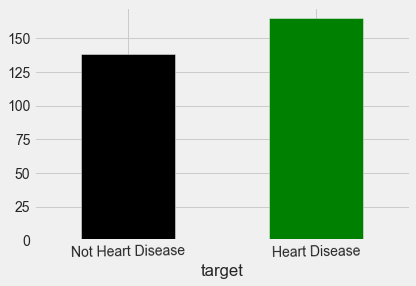

In [16]:
# How many of each class are there in target ?

df.groupby('target')['target'].agg('count').plot(kind='bar',color=['black', 'green']);
plt.xticks([1, 0], ["Heart Disease", "Not Heart Disease"], rotation=1);

print("The number of subjects with heart disease: ", len(df[df['target'] == 1]))
print("The number of subjects without heart disease: ", len(df[df['target'] == 0]))

We have 165 person with heart disease and 138 person without heart disease, so our problem is balanced.

In [17]:
# Create a plot of a crosstab of the Sex and Target columns
#How is sex related to target?

# pd.crosstab(df.target, df.sex).plot(kind='bar', figsize=(6, 6), color=['black', 'green'])
# plt.title("Heart Disease Frequency for Sex")
# plt.xlabel("Sex")
# plt.ylabel("Count")
# plt.legend(["Female", "Male"])
# plt.xticks([0, 1], ["No Disease", "Disease"], rotation=1);


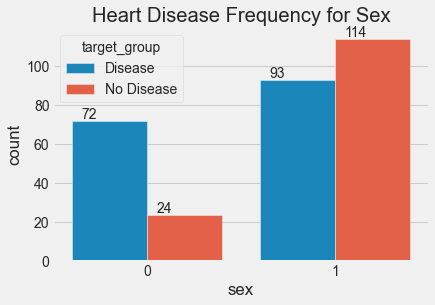

In [18]:
#How is sex related to target?¶

df["target_group"] = df.target.map({0 : "No Disease" , 1 : "Disease"})
fig = sns.countplot(data = df , x = "sex", hue = "target_group")
plt.title("Heart Disease Frequency for Sex")
#plt.legend(["Female", "Male"])
for p in fig.patches:
    fig.annotate(p.get_height(), (p.get_x()+0.05, p.get_height()+1))    # red : male, blue: Female

#### `No Heart Disese:`
-  We have `114 Males` and `24 Females` who are not suffering from heart disease. 

#### `Heart disease:`
- We have `93 Males` and `72 Females` who are suffering from Heart disease 
- Therefore, number of Male paitent has more Heart disease then Female. 

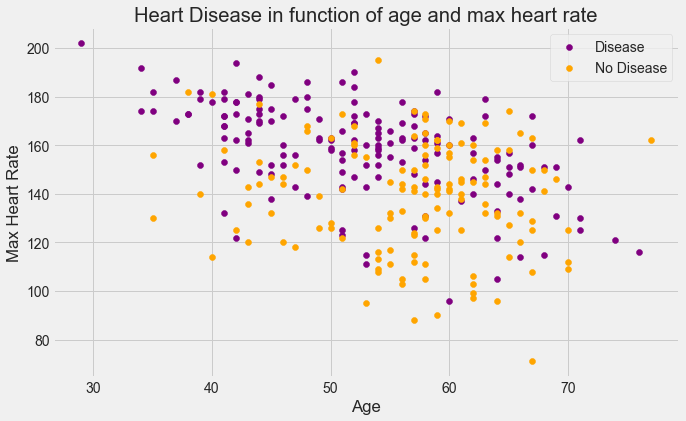

In [19]:
#Age vs. Max Heart Rate
#Now we'll create a scatter plot to show patterns between the maximum heart rate of subjects against their age.


# Create a figure
plt.figure(figsize=(10, 6))

# Scatter with positive examples
plt.scatter(df.age[df.target==1],
            df.thalach[df.target==1],
            color='purple')
# Scatter with negative examples
plt.scatter(df.age[df.target==0],
            df.thalach[df.target==0],
            color='orange')
# Add title, labels and legend
plt.title("Heart Disease in function of age and max heart rate")
plt.xlabel("Age")
plt.ylabel("Max Heart Rate")
plt.legend(["Disease", "No Disease"]);


here, we can clearly see the pateient having heart disease is more in between 40 - 70 age 

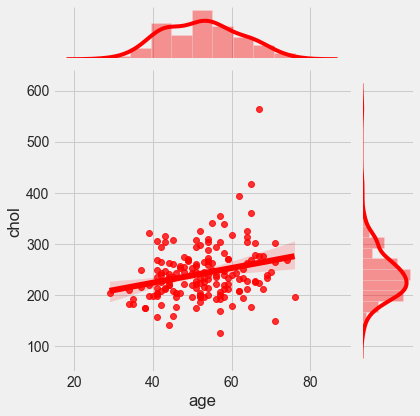

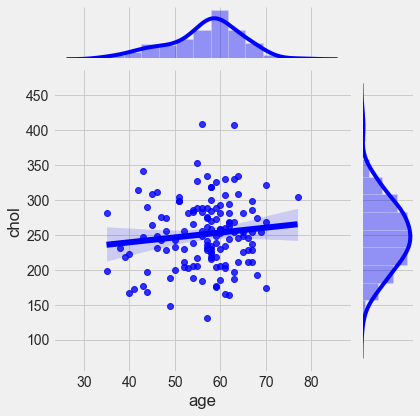

In [20]:
#How age is related to cholestrol for people having a heart disease and people not having heart disease ?

disease = df[df["target"] == 1]
No_disease = df[df["target"] == 0]

sns.jointplot(data = disease , x = "age" , y = "chol" , kind = "reg", color = 'red')    # The jointplot() is used to display the mutual distribution of each column. 
sns.jointplot(data = No_disease , x = "age" , y = "chol" , kind = "reg", color = 'blue')   #kind must be either 'scatter', 'reg', 'resid', 'kde', or 'hex'

here we see, how the cholestrol affect the age of person. age between 50 - 70 is very critical age to have Heart related poroblem. the joint graph show us the skewness of the chol and age.

In [21]:
# Perhaps now we can drop all examples of subjects with age < 40 and > 70 to deal with outliers we can see in the above scatter plot.

print("Number of subjects under 40 years old: ", len(df.loc[df['age'] < 40]))
print("Number of subjects over 70 years old: ", len (df.loc[df["age"] > 70]))

Number of subjects under 40 years old:  16
Number of subjects over 70 years old:  6


In [22]:
# Drop the outliers
under_40 = df[df['age']<40].index
over_70 = df[df['age']>70].index

df.drop(under_40, inplace=True)
df.drop(over_70, inplace=True)

In [23]:
# Check that the outliers have been removed

print("Number of subjects under 40 years old: ", len(df.loc[df['age'] < 40]))
print("Number of subjects over 70 years old: ", len (df.loc[df["age"] > 70]))

Number of subjects under 40 years old:  0
Number of subjects over 70 years old:  0


 here we see drop the outlier whose age is under 40 year and over 70 year 

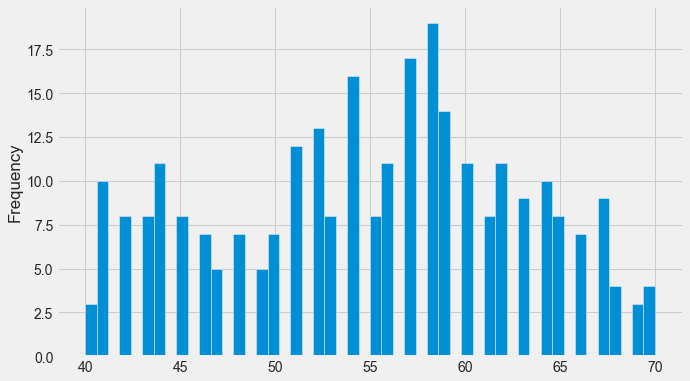

In [24]:
# Check the distribution of the modified Dataframe
df.age.plot.hist(figsize=(10, 6),bins=50);                 # How people are divided into different age groups ?

age between 50 - 70 have maximum frequency for heart disease.

#### Heart Disease Frequency per Chest Pain Type
cp = chest pain type

- 0: Typical Angina: Chest pain related to the heart
- 1: Atypical angina: Chest pain not related to the heart
- 2: Non-Anginal pain: Typically esophageal spasms(not heart related)
- 3: Asymptomatic: Chest pain not showing signs of disease

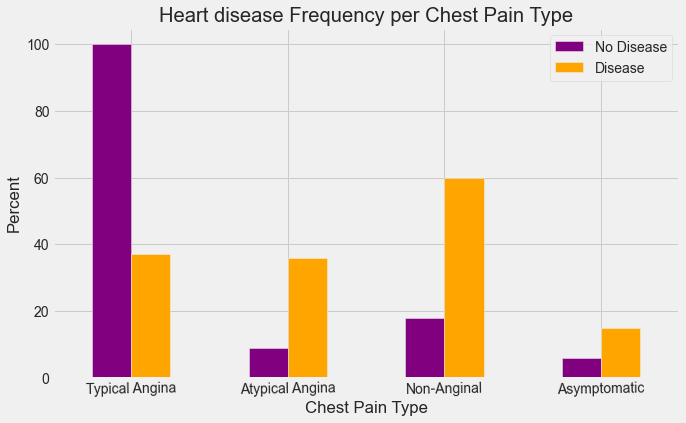

In [25]:
# Creat a plot of the crosstab of chest pain types against the target labels
#How age is related to chest pain type ?
# What are the percentage of people suffering for different chest pain types?

# adding a column to the dataframe that describes the chest pain type and plotting a pie chart representing percentage of people having that pain

pd.crosstab(df.cp, df.target).plot(kind='bar',
                                   figsize=(10, 6),
                                   color=['purple', 'orange'])
# pd.update_traces(rotation = 90 , pull = 0.05 , textinfo = "percent+label")
# pd.show()
plt.title("Heart disease Frequency per Chest Pain Type")
plt.xlabel("Chest Pain Type")
plt.ylabel("Percent")
plt.legend(["No Disease", "Disease"])
plt.xticks([0, 1, 2, 3], ['Typical Angina', 'Atypical Angina', 'Non-Anginal', 'Asymptomatic'], rotation=1 );



this graph shows that how the chest pain related to the heart Disease 
0 = 'Typical Angina', 1 = 'Atypical Angina', 2 = 'Non-Anginal', 3= 'Asymptomatic'
Non- Anginal chest pain is very high percent anomg all cp category. the change of heart related proplem is high.

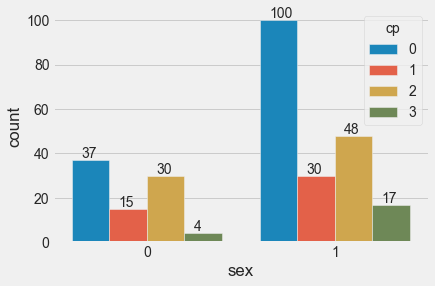

In [26]:
#What is relationship between chest pain type and sex ?

fig = sns.countplot(data = df , x = "sex" , hue = "cp")
for p in fig.patches:
    fig.annotate(p.get_height(), (p.get_x()+0.05, p.get_height()+1))

this graph show how the chest pain related to the sex category ; male : 1, female : 0

In [27]:
# What is the percentage of people having fasting blood sugar above and below 120 ?


df["fbs_group"] = df.fbs.map({0 : "Fasting Blood Sugar < 120 mg/dl" , 1 : "Fasting Blood Sugar > 120 mg/dl"})

fbs = df[['fbs_group']]
fbs["count"] = fbs.groupby(fbs.fbs_group)["fbs_group"].transform("count")
fbs = fbs.drop_duplicates()
fig = px.pie(data_frame = fbs , names = "fbs_group" , values = "count" , template = "seaborn")
fig.update_traces (textinfo = "percent+label" , pull = 0.05 , rotation = 90)
fig.show()

- high blood sugar can damage blood vessels and the nerves that control your heart. People with diabetes are also more likely to have other conditions that raise the risk for heart disease: High blood pressure increases the force of blood through your arteries and can damage artery walls

- As fasting glucose levels increased to >100 mg/dL, risks for CVD, ischemic heart disease, myocardial infarction, and thrombotic stroke progressively increased, but risk for hemorrhagic stroke did not. Fasting glucose levels <70 mg/dL were associated with increased risk of all stroke (hazard ratio 1.06, 95% CI 1.01-1.11) in men and (hazard ratio 1.11, 1.05-1.17) in women.

- Both low glucose level and impaired fasting glucose should be considered as predictors of risk for stroke and coronary heart disease. The fasting glucose level associated with the lowest cardiovascular risk may be in a narrow range.

- 84.3% = "Fasting Blood Sugar < 120 mg/dl 
- 15.7% = "Fasting Blood Sugar > 120 mg/dl 

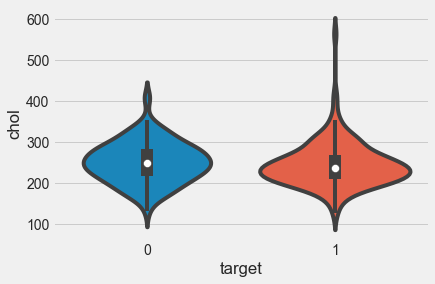

In [28]:
#What is the relationship of cholestrol with target ?
# relationship of cholestrol with target

sns.violinplot(data= df , x = "target" , y = "chol")

it show how the cholestrol is directly perporsional to the heart disease attack .

In [29]:
#Which age group is more likely to have a heart disease?

df["age_group"] = pd.cut(df["age"] , (0 , 30 , 40 , 50, 60, 70, 80) , labels = ["0 - 30" , "30 - 40" , "40 - 50", "50 - 60", "60 - 70", "70 - 80"])
df.head()    #(0 , 30 , 40 , 50, 60, 70, 80) , labels = ["0-30" , "30-40" , "40-50", "50 - 60", "60-70", "70 - 80"])

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target,target_group,fbs_group,age_group
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1,Disease,Fasting Blood Sugar > 120 mg/dl,60 - 70
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1,Disease,Fasting Blood Sugar < 120 mg/dl,40 - 50
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1,Disease,Fasting Blood Sugar < 120 mg/dl,50 - 60
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1,Disease,Fasting Blood Sugar < 120 mg/dl,50 - 60
5,57,1,0,140,192,0,1,148,0,0.4,1,0,1,1,Disease,Fasting Blood Sugar < 120 mg/dl,50 - 60


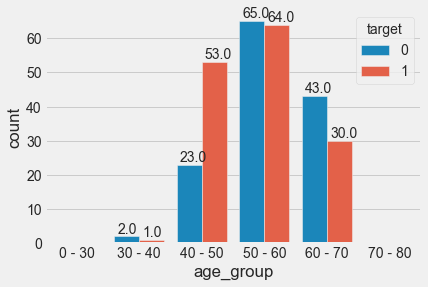

In [30]:
fig = sns.countplot(data= df , x = "age_group" , hue = "target")
for p in fig.patches:
    fig.annotate(p.get_height(), (p.get_x()+0.05, p.get_height()+1))

here, we got how the age group is co-related with the target value 

- 50-60 age group pepole we 64% person having Heart related problem  
- 60-70 age group people having 30% chance
- 40-5- age group people have 53% chance to have aheart disease

In [31]:
#  distribution:
df.groupby("target").size()     

target
0    133
1    148
dtype: int64

In [32]:
df.groupby("thal").size()

thal
0      2
1     18
2    148
3    113
dtype: int64

In [33]:
df.groupby("ca").size()

ca
0    159
1     63
2     37
3     19
4      3
dtype: int64

In [34]:
df.groupby("slope").size()

slope
0     20
1    134
2    127
dtype: int64

In [35]:
 df.groupby("exang").size() 

exang
0    187
1     94
dtype: int64

In [36]:
df.groupby("restecg").size()

restecg
0    140
1    138
2      3
dtype: int64

In [37]:
 df.groupby("fbs").size()

fbs
0    237
1     44
dtype: int64

In [38]:
df.groupby("cp").size()

cp
0    137
1     45
2     78
3     21
dtype: int64

In [39]:
df.groupby("sex").size()

sex
0     86
1    195
dtype: int64

##  Correlation Analysis:

In [40]:
# To find the correlation among 
# the columns using pearson method 
df.corr(method ='pearson')          #cov(x, y) / [std(x)*std(y)] = Pearson correlation
                                  # Pearson corr = direction of relationship + Strenght of direction

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
age,1.000000,-0.067863,-0.030487,0.307594,0.181240,0.092993,-0.109329,-0.336695,0.075986,0.248362,-0.177008,0.291570,0.093017,-0.248509
sex,-0.067863,1.000000,-0.046515,-0.073843,-0.231485,0.052404,-0.028601,-0.066192,0.127146,0.086269,-0.015731,0.108858,0.196048,-0.258357
cp,-0.030487,-0.046515,1.000000,0.059284,-0.066613,0.101391,0.031268,0.286712,-0.397820,-0.156914,0.120680,-0.203029,-0.152193,0.428822
trestbps,0.307594,-0.073843,0.059284,1.000000,0.106461,0.186641,-0.123314,-0.043688,0.074498,0.200509,-0.119793,0.081851,0.066004,-0.150833
chol,0.181240,-0.231485,-0.066613,0.106461,1.000000,-0.003617,-0.113386,0.009345,0.040948,0.054823,-0.000048,0.070642,0.093370,-0.060268
fbs,0.092993,0.052404,0.101391,0.186641,-0.003617,1.000000,-0.066718,0.017915,0.026590,0.005091,-0.059789,0.144902,-0.035277,-0.023033
restecg,-0.109329,-0.028601,0.031268,-0.123314,-0.113386,-0.066718,1.000000,0.042933,-0.045924,-0.084698,0.124101,-0.072464,-0.006933,0.125324
thalach,-0.336695,-0.066192,0.286712,-0.043688,0.009345,0.017915,0.042933,1.000000,-0.383765,-0.366371,0.387045,-0.239937,-0.083704,0.427865
exang,0.075986,0.127146,-0.397820,0.074498,0.040948,0.026590,-0.045924,-0.383765,1.000000,0.290009,-0.267313,0.121789,0.187964,-0.415564
oldpeak,0.248362,0.086269,-0.156914,0.200509,0.054823,0.005091,-0.084698,-0.366371,0.290009,1.000000,-0.559868,0.274084,0.198030,-0.432750


- age is negatively co-related with sex, cp, restecg, thalach, slope, and target and posite corerrelated with trestbps, chol, fbs, exang, oldpeak, ca and thal. age is highly corelated with trestbps, ca and weakly co-related with thalach

- sex is negatively corelated with every column except fbs exang, oldpeak, ca, and thal. sex is highly corelated with thal and weakly corelated with target.

- cp is highly corelated with target and weakly corelated with exang.
- trestbps is highly corelated with age and weakly corelated with target.
- chol is highly corelated with age and weakly corelated with sex
- fbs is highly corelated with restecg  and weakly corelated with trestbps
- restecg is highly corelated with target and weakly corelated with trestbps
- thalach is highly corelated with target and weakly corelated with exang
- exang is highly corelated with oldpeak and weakly corelated with target
- oldpeak is highly corelated with exang and weakly corelated with slope
- slope is highly corelated with thalach and target and weakly corelated with oldpeak
- ca is highly corelated with oldpeak and age and weakly corelated with target
- thal is highly corelated with sex and oldpeak and weakly corelated with target
- target is highly corelated with cp and thalch and weakly corelated withexang and ca



In [42]:
df.corr(method = "spearman")            # The Spearman correlation coefficient is defined as the Pearson correlation coefficient between the rank variables


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
age,1.000000,-0.072980,-0.059630,0.305195,0.148719,0.085360,-0.113811,-0.342807,0.072400,0.281693,-0.187314,0.328575,0.106293,-0.255026
sex,-0.072980,1.000000,-0.057135,-0.070063,-0.184118,0.052404,-0.021214,-0.065696,0.127146,0.102099,-0.011023,0.118305,0.237713,-0.258357
cp,-0.059630,-0.057135,1.000000,0.040793,-0.081701,0.096041,0.057089,0.314783,-0.422710,-0.155047,0.159847,-0.231680,-0.197020,0.455276
trestbps,0.305195,-0.070063,0.040793,1.000000,0.111287,0.162326,-0.137295,-0.043125,0.063213,0.159959,-0.083991,0.070443,0.066883,-0.132291
chol,0.148719,-0.184118,-0.081701,0.111287,1.000000,-0.002475,-0.119075,-0.023650,0.062813,0.045278,-0.010008,0.093120,0.073880,-0.098285
fbs,0.085360,0.052404,0.096041,0.162326,-0.002475,1.000000,-0.063927,0.012678,0.026590,0.028200,-0.045449,0.129036,-0.010128,-0.023033
restecg,-0.113811,-0.021214,0.057089,-0.137295,-0.119075,-0.063927,1.000000,0.082649,-0.054365,-0.109932,0.145648,-0.087840,-0.005072,0.139386
thalach,-0.342807,-0.065696,0.314783,-0.043125,-0.023650,0.012678,0.082649,1.000000,-0.409843,-0.447715,0.435035,-0.269835,-0.147672,0.434623
exang,0.072400,0.127146,-0.422710,0.063213,0.062813,0.026590,-0.054365,-0.409843,1.000000,0.302053,-0.283014,0.161257,0.228259,-0.415564
oldpeak,0.281693,0.102099,-0.155047,0.159959,0.045278,0.028200,-0.109932,-0.447715,0.302053,1.000000,-0.577419,0.265905,0.241618,-0.424253


In [43]:
df.skew()    # positive skew : chol, fbs, oldpeaks, ca
              # negative skew: age, sex, thalach, slope, thal, target

age        -0.152466
sex        -0.846229
cp          0.534547
trestbps    0.709479
chol        1.185322
fbs         1.900136
restecg     0.178015
thalach    -0.599330
exang       0.705223
oldpeak     1.247325
slope      -0.460008
ca          1.228702
thal       -0.543325
target     -0.107489
dtype: float64

In [44]:
df.kurtosis()    

age        -0.904352
sex        -1.293151
cp         -1.151030
trestbps    0.854362
chol        4.798231
fbs         1.622012
restecg    -1.449171
thalach    -0.003027
exang      -1.513484
oldpeak     1.585428
slope      -0.645967
ca          0.588015
thal        0.278672
target     -2.002752
dtype: float64

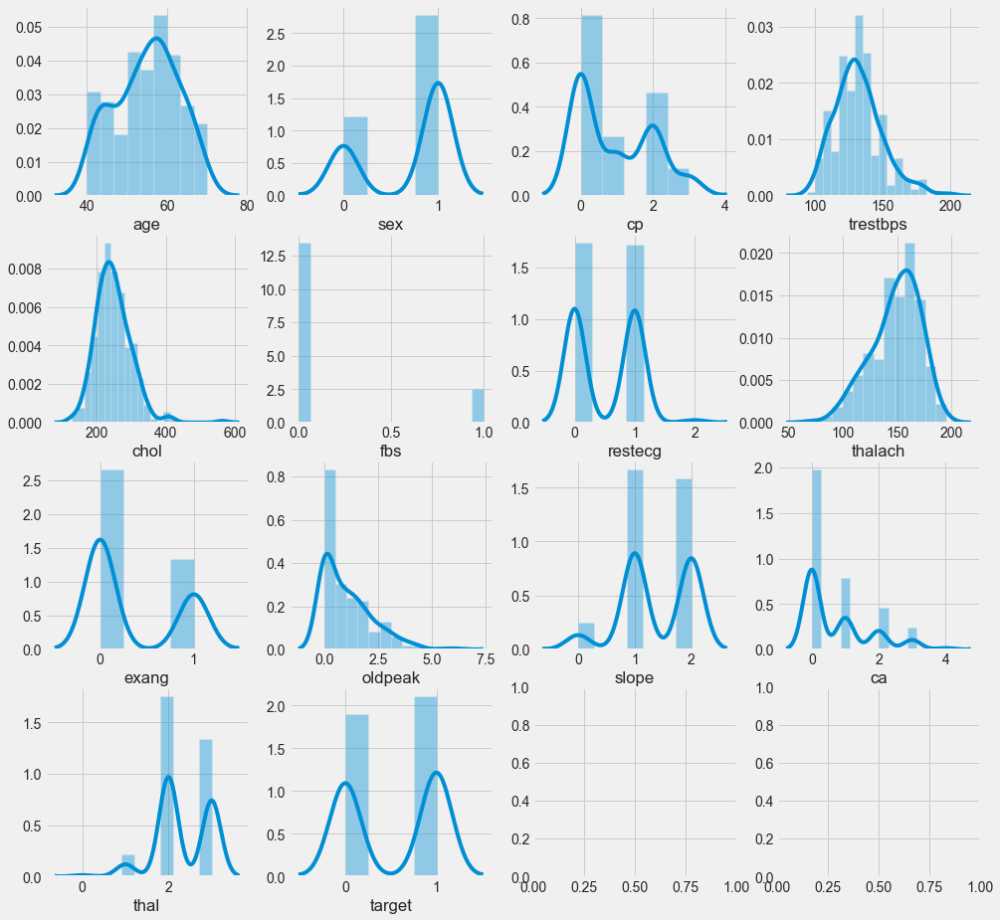

In [46]:
#histogram
#sns.distplot(df(), bins=50, kde=False);


#Display Multiple Distribution Plots. Histograms for Continuous Features
fig,ax = plt.subplots(4,4, figsize=(15,15))  # 'ax' has references to all the four axes
sns.distplot(df['age'], ax = ax[0,0]) 
sns.distplot(df['sex'], ax = ax[0,1])
sns.distplot(df['cp'], ax = ax[0,2]) 
sns.distplot(df['trestbps'], ax = ax[0,3])
sns.distplot(df['chol'], ax = ax[1,0])
sns.distplot(df['fbs'], ax = ax[1,1])
sns.distplot(df['restecg'], ax = ax[1,2])
sns.distplot(df['thalach'], ax = ax[1,3])
sns.distplot(df['exang'], ax = ax[2,0])
sns.distplot(df['oldpeak'], ax = ax[2,1])
sns.distplot(df['slope'], ax = ax[2,2])
sns.distplot(df['ca'], ax = ax[2,3])
sns.distplot(df['thal'], ax = ax[3,0]) 
sns.distplot(df['target'], ax = ax[3,1])

plt.show()

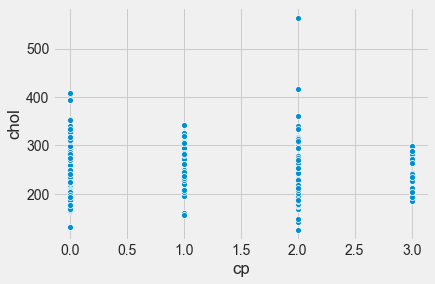

In [47]:
sns.scatterplot(x='cp',y='chol', data = df)

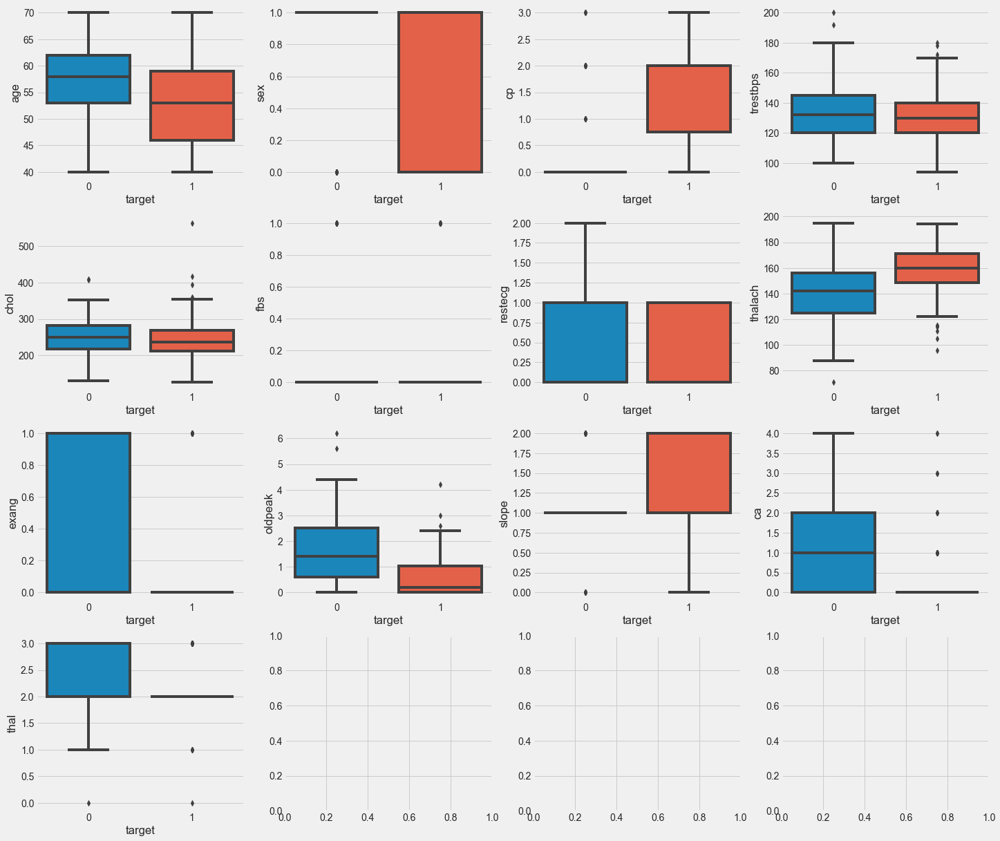

In [48]:
fig,ax = plt.subplots(4,4, figsize=(22,20))     # 'ax' has references to all the four axes
sns.boxplot(df['target'], df['age'], ax = ax[0,0])  # Plot on 1st axes 
sns.boxplot(df['target'], df['sex'], ax = ax[0,1])  # Plot on IInd axes
sns.boxplot(df['target'], df['cp'], ax = ax[0,2])
sns.boxplot(df['target'], df['trestbps'], ax = ax[0,3])
sns.boxplot(df['target'], df['chol'], ax = ax[1,0])  
sns.boxplot(df['target'], df['fbs'], ax = ax[1,1])  
sns.boxplot(df['target'], df['restecg'], ax = ax[1,2]) 
sns.boxplot(df['target'], df['thalach'], ax = ax[1,3]) 
sns.boxplot(df['target'], df['exang'], ax = ax[2,0])
sns.boxplot(df['target'], df['oldpeak'], ax = ax[2,1])
sns.boxplot(df['target'], df['slope'], ax = ax[2,2])   
sns.boxplot(df['target'], df['ca'], ax = ax[2,3])
sns.boxplot(df['target'], df['thal'], ax = ax[3,0])
# sns.boxplot(df['target'], df['target'], ax = ax[3,1]);


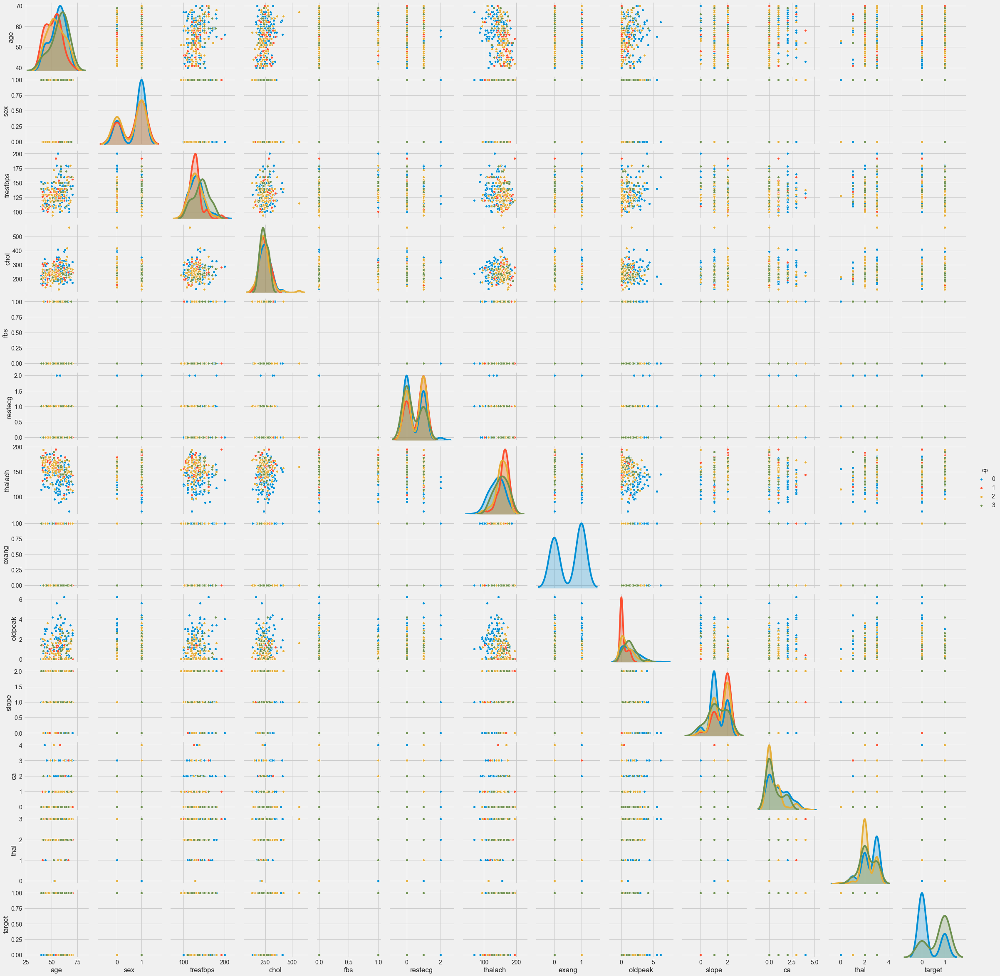

In [49]:
sns.pairplot(df,hue="cp")

There is a lot of overlap between the classes for many of the numerical features, suggesting that the use of non-linear classification algorithms such as k-Nearest Neighbours, Decision Trees and Random Forests would be more suitable for performing classification.

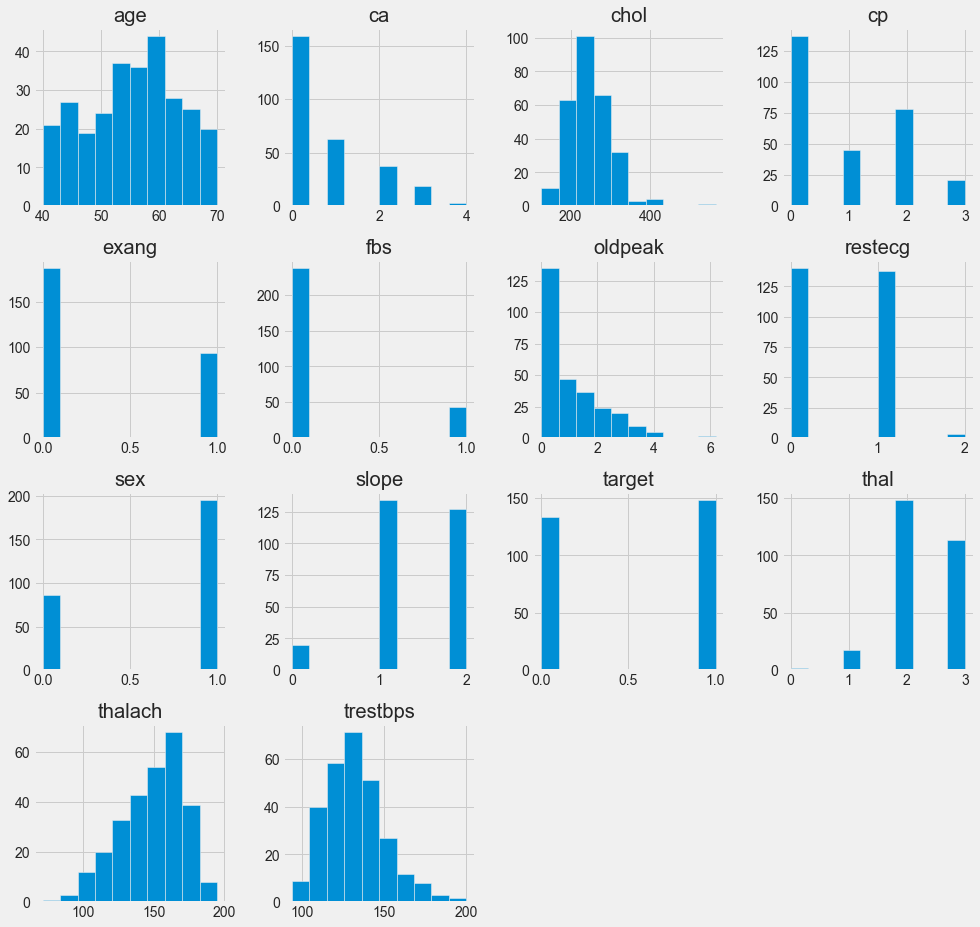

In [50]:
df.hist(figsize=(15,15))
# plt.figure(figsize=(15,10))
plt.show()

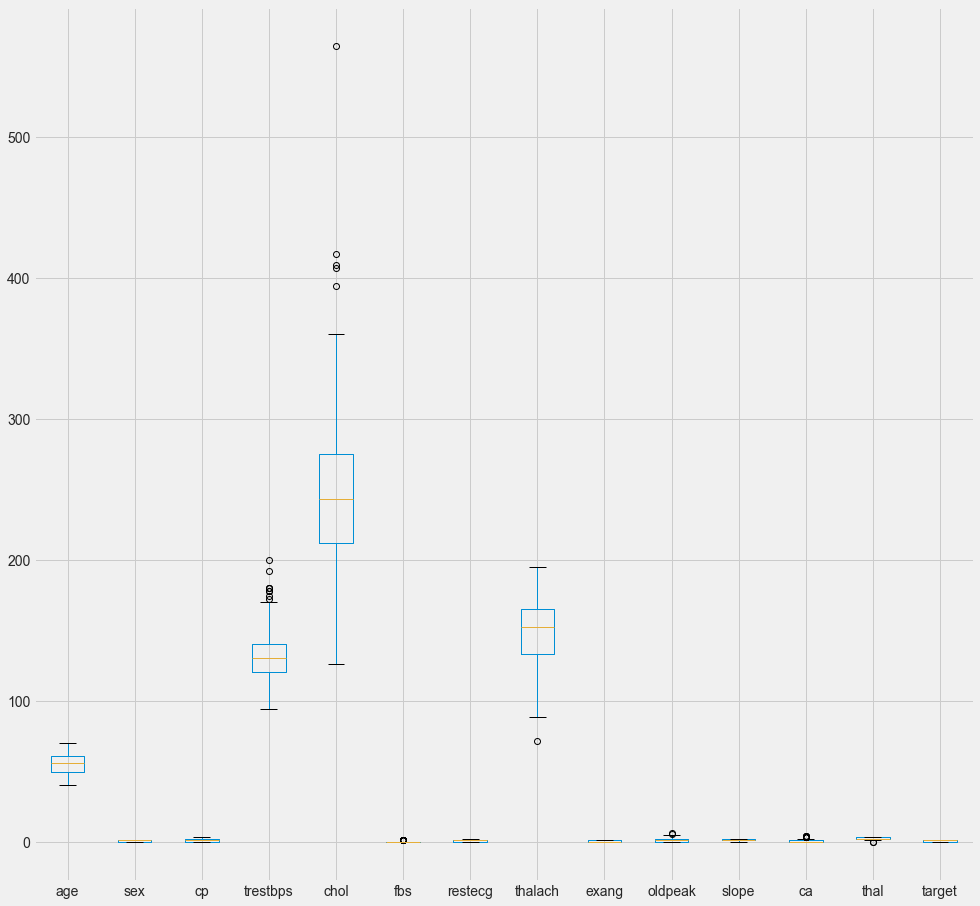

In [51]:
df.boxplot(figsize=(15,15))
plt.show()

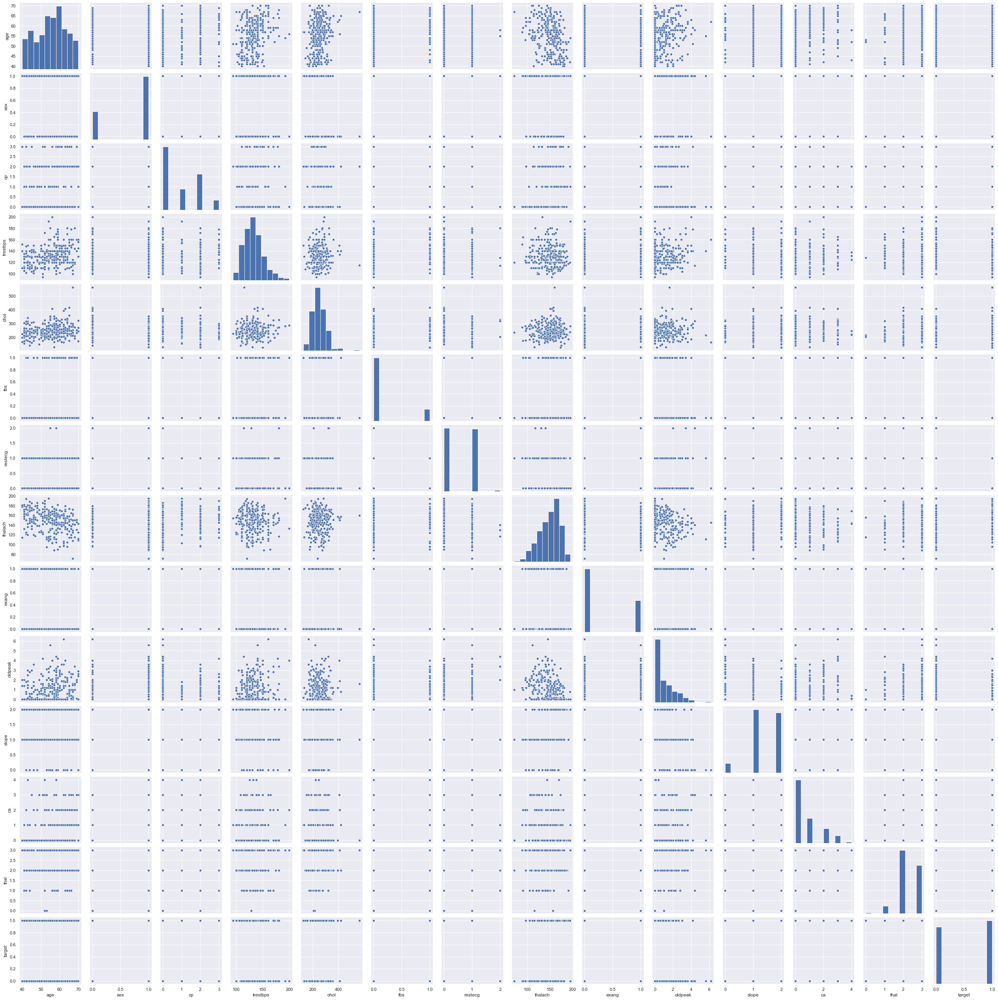

In [52]:
#scatterplot
sns.set()
cols = ['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target']
sns.pairplot(df[cols], height = 2.5)
plt.show()

# MF_pairplot = sns.pairplot(full_data[['age','trestbps','chol','thalach','oldpeak','target']], hue='target', kind ='reg', height = 4)
# MF_pairplot

In [53]:
# df1=pd.get_dummies(df)
# df1.head()

# Correlation Matrix:

(14.5, -0.5)

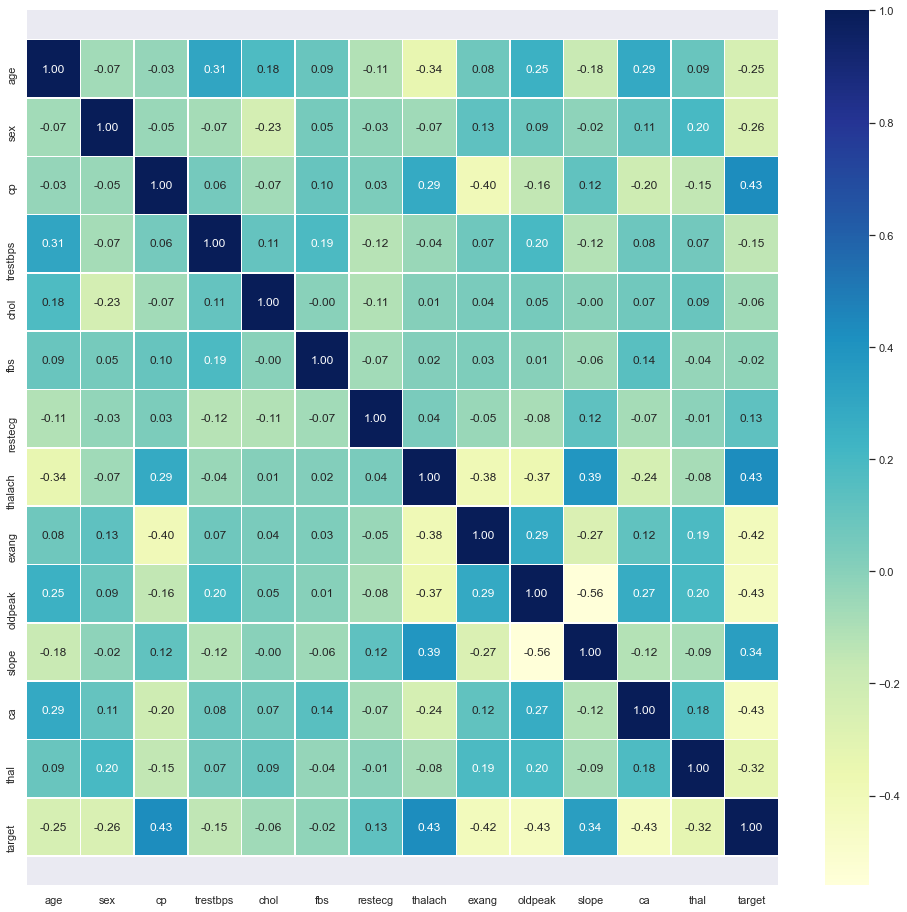

In [54]:
# # check correlation with heat map
# #Correlation Heatmap of HR Data(Numerical variables)
# corrMatrix = df.corr()
# plt.figure(figsize=(15,10))
# sns.heatmap(corrMatrix, annot=True)
# plt.show()

#Let's make our correlation matrix a little prettier
corr_matrix = df.corr()
fig, ax = plt.subplots(figsize=(15, 15))
ax = sns.heatmap(corr_matrix,
                 annot=True,
                 linewidths=0.5,
                 fmt=".2f",
                 cmap="YlGnBu");
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

cp and thalach is strongly correlated with target whereas exang and oldpeak is is weakly correlated

In [55]:
#IDtest=test["unique_id"]

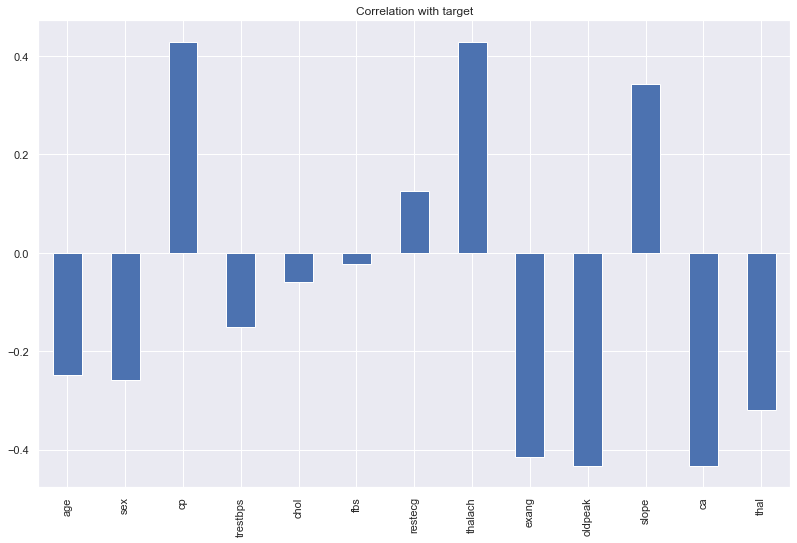

In [56]:
df.drop('target', axis=1).corrwith(df.target).plot(kind='bar', grid=True, figsize=(12, 8), 
                                                   title="Correlation with target")

### Observations from correlation:

1. fbs and chol are the least correlated with the target variable.
2. All other variables have a significant correlation with the target variable.



*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


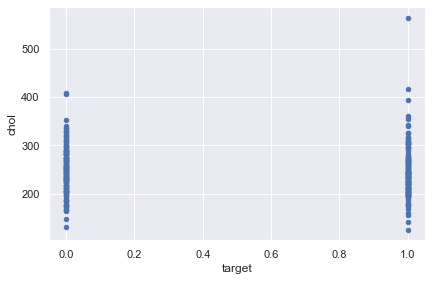

In [57]:
var = 'chol'
data_var = pd.concat([df['target'], df[var]], axis=1)
data_var.plot.scatter(x='target', y=var);

In [58]:
# #scatterplot
# sns.set()
# cols = ['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target']
# sns.pairplot(df[cols], height = 2.5)
# plt.show()

In [59]:
#standardizing data to mitigate skewness and kurtosis

from sklearn.preprocessing import StandardScaler

diseas_predict_scaled = StandardScaler().fit_transform(df['cp'][:,np.newaxis]);
low_range = diseas_predict_scaled[diseas_predict_scaled[:,0].argsort()][:10]
high_range= diseas_predict_scaled[diseas_predict_scaled[:,0].argsort()][-10:]
print('outer range (low) of the distribution:')
print(low_range)
print('\nouter range (high) of the distribution:')
print(high_range)

outer range (low) of the distribution:
[[-0.912354]
 [-0.912354]
 [-0.912354]
 [-0.912354]
 [-0.912354]
 [-0.912354]
 [-0.912354]
 [-0.912354]
 [-0.912354]
 [-0.912354]]

outer range (high) of the distribution:
[[2.00095821]
 [2.00095821]
 [2.00095821]
 [2.00095821]
 [2.00095821]
 [2.00095821]
 [2.00095821]
 [2.00095821]
 [2.00095821]
 [2.00095821]]


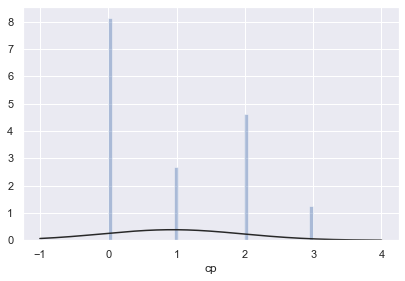

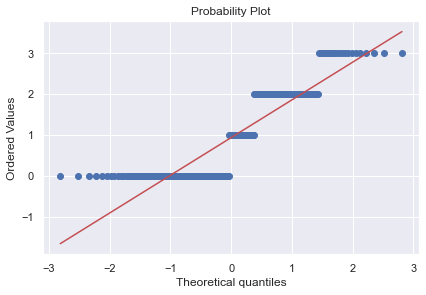

In [60]:
from scipy.stats import norm
from scipy import stats
#histogram and normal probability plot
sns.distplot(df['cp'], fit=norm, bins=50, kde=False);
fig = plt.figure()
res = stats.probplot(df['cp'], plot=plt)

In [61]:
#applying log transformation
df['chol'] = np.log(df['chol'])

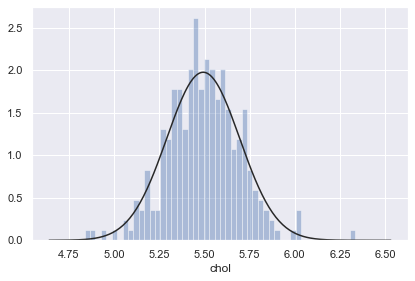

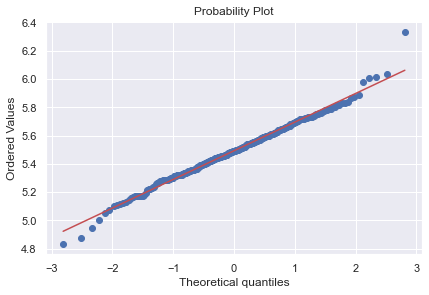

In [62]:
#transformed histogram and normal probability plot
sns.distplot(df['chol'], fit=norm, bins=50, kde=False);
fig = plt.figure()
res = stats.probplot(df['chol'], plot=plt)

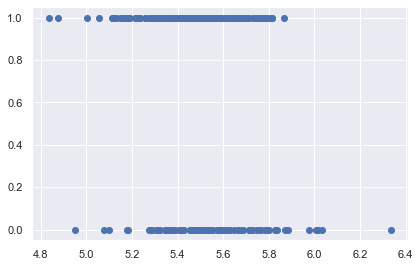

In [63]:
#scatter plot
plt.scatter(df['chol'], df['sex']);

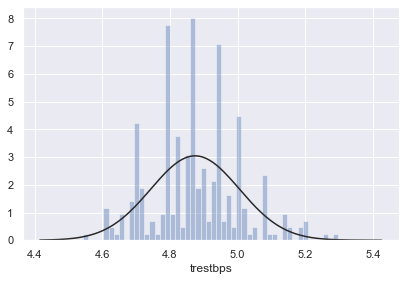

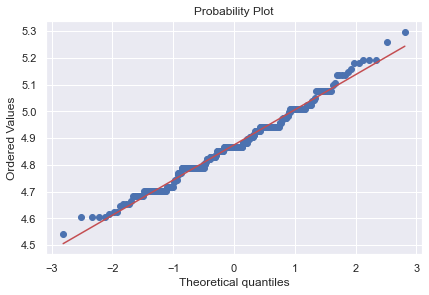

In [64]:
#histogram and normal probability plot
df['trestbps'] = np.log(df['trestbps'])
sns.distplot(df['trestbps'], fit=norm, bins=50, kde=False);
fig = plt.figure()
res = stats.probplot(df['trestbps'], plot=plt)

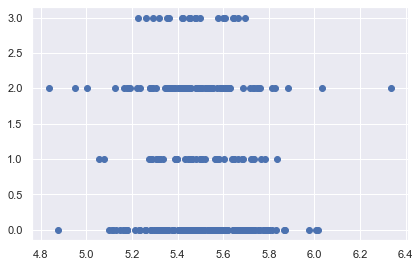

In [65]:
#scatter plot
plt.scatter(df['chol'], df['cp']);

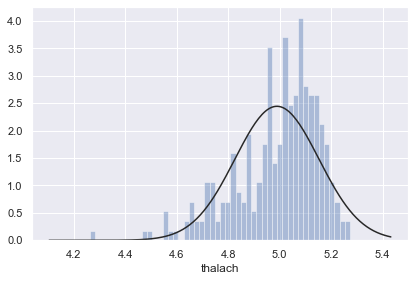

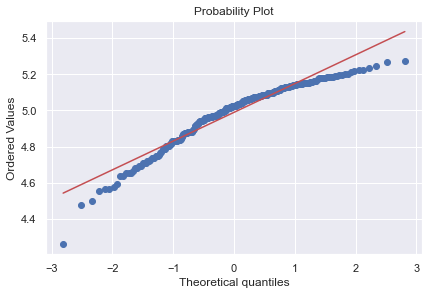

In [66]:
#histogram and normal probability plot
df['thalach'] = np.log(df['thalach'])
sns.distplot(df['thalach'], fit=norm, bins=50, kde=False);
fig = plt.figure()
res = stats.probplot(df['thalach'], plot=plt)

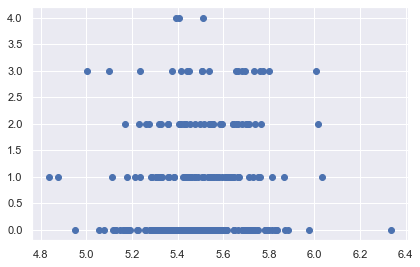

In [67]:
#scatter plot
plt.scatter(df['chol'], df['ca']);

In [72]:
# by this code we will try to find all the categorical and numerical variables separately.

categorical_val = []
continous_val = []
for column in df.columns:
    print('==============================')
    print(f"{column} : {df[column].unique()}")
    if len(df[column].unique()) <= 10:
        categorical_val.append(column)
    else:
        continous_val.append(column)

print('==============================')
print("Categorical Variables : ", categorical_val, '\n')
print("Numerical Variables : ", continous_val)
        

age : [63 41 56 57 44 52 54 48 49 64 58 50 66 43 69 59 42 61 40 51 65 53 46 45
 47 62 55 60 67 68 70]
sex : [1 0]
cp : [3 1 0 2]
trestbps : [4.97673374 4.86753445 4.78749174 4.94164242 5.14749448 5.01063529
 4.70048037 4.90527478 4.65396035 4.82831374 4.95582706 5.04342512
 5.07517382 4.6443909  4.92725369 4.85203026 4.68213123 4.8978398
 4.80402104 4.74493213 4.77068462 4.60517019 4.82028157 4.54329478
 4.71849887 4.62497281 5.02388052 4.61512052 4.88280192 4.99721227
 5.18178355 4.8598124  5.19295685 4.91265489 4.83628191 4.66343909
 5.04985601 5.13579844 4.98360662 4.76217393 5.29831737 5.10594547
 5.1590553  5.25749537 4.9698133  4.81218436 5.0369526  4.73619845
 5.09986643]
chol : [5.45103845 5.31811999 5.46383181 5.86929691 5.25749537 5.68357977
 5.57215403 5.29330482 5.12396398 5.47646355 5.6167711  5.58349631
 5.35185813 5.6454469  5.38907173 5.82894562 5.420535   5.50938834
 5.45532112 5.49306144 5.35658627 5.16478597 6.03308622 5.28320373
 5.28826703 5.17614973 5.6094718  5.3

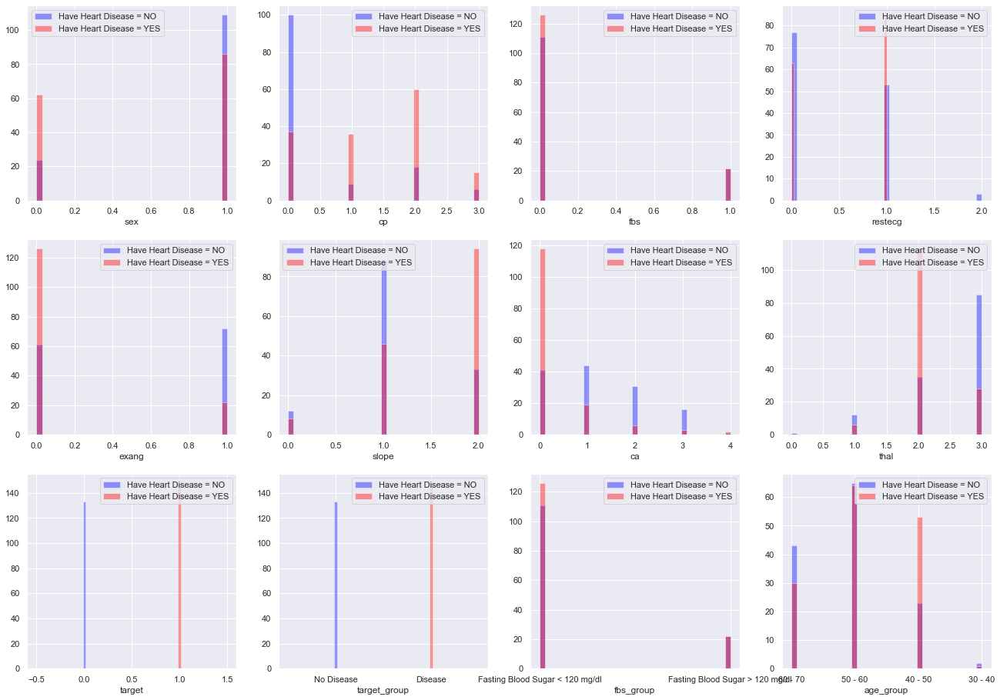

In [74]:
plt.figure(figsize=(20, 20))

for i, column in enumerate(categorical_val, 1):
   
    plt.subplot(4, 4, i)
    df[df["target"] == 0][column].hist(bins=35, color='blue', label='Have Heart Disease = NO', alpha=0.4)
    df[df["target"] == 1][column].hist(bins=35, color='red', label='Have Heart Disease = YES', alpha=0.4)
    plt.legend()
    plt.xlabel(column)
    

### Observations from the above plot:

1. cp {Chest pain}: People with cp 1, 2, 3 are more likely to have heart disease than people with cp 0.
2. restecg {resting EKG results}: People with a value of 1 (reporting an abnormal heart rhythm, which can range from mild symptoms to severe problems) are more likely to have heart disease.
3. exang {exercise-induced angina}: people with a value of 0 (No ==> angina induced by exercise) have more heart disease than people with a value of 1 (Yes ==> angina induced by exercise)
4. slope {the slope of the ST segment of peak exercise}: People with a slope value of 2 (Downslopins: signs of an unhealthy heart) are more likely to have heart disease than people with a slope value of 2 slope is 0 (Upsloping: best heart rate with exercise) or 1 (Flatsloping: minimal change (typical healthy heart)).
5. ca {number of major vessels (0-3) stained by fluoroscopy}: the more blood movement the better, so people with ca equal to 0 are more likely to have heart disease.
6. thal {thalium stress result}: People with a thal value of 2 (defect corrected: once was a defect but ok now) are more likely to have heart disease.

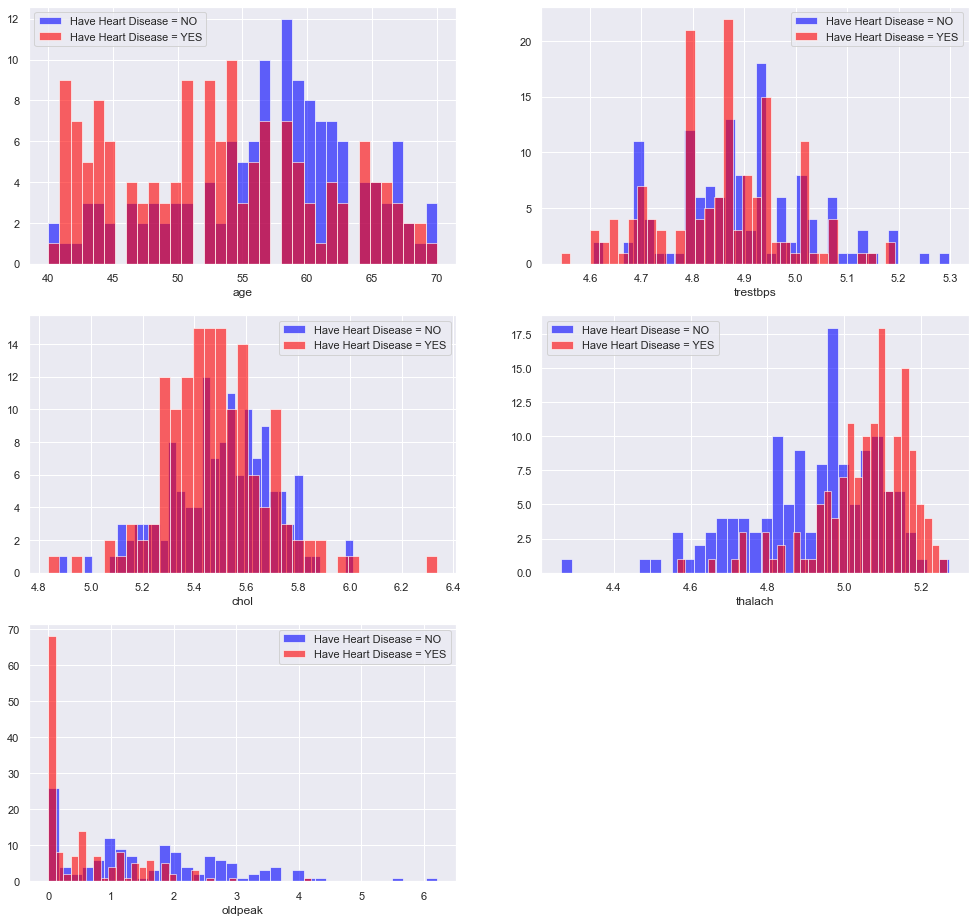

In [75]:
plt.figure(figsize=(15, 15))

for i, column in enumerate(continous_val, 1):
    plt.subplot(3, 2, i)
    df[df["target"] == 0][column].hist(bins=35, color='blue', label='Have Heart Disease = NO', alpha=0.6)
    df[df["target"] == 1][column].hist(bins=35, color='red', label='Have Heart Disease = YES', alpha=0.6)
    plt.legend()
    plt.xlabel(column)

### Observations from the above plot:

1. trestbps: resting blood pressure anything above 130-140 is generally of concern
2. chol: greater than 200 is of concern.
3. thalach: People with a maximum of over 140 are more likely to have heart disease.
4. the old peak of exercise-induced ST depression vs. rest looks at heart stress during exercise an unhealthy heart will stress more.

## Feature Scaling:
### By Using One-Hot-Encoding

After exploring the dataset, I observed that I need to convert some categorical variables into dummy variables and scale all the values before training the Machine Learning models. First, I'll use the `get_dummies` method to create dummy columns for categorical variables.



In [76]:
categorical_val.remove('target')            # ne-Hot Encoding - required by classification algorithms
dataset = pd.get_dummies(df, columns = categorical_val)
dataset.head()


# df1=pd.get_dummies(df)
# df1.head()

,age,trestbps,chol,thalach,oldpeak,target,sex_0,sex_1,cp_0,cp_1,...,target_group_Disease,target_group_No Disease,fbs_group_Fasting Blood Sugar < 120 mg/dl,fbs_group_Fasting Blood Sugar > 120 mg/dl,age_group_0 - 30,age_group_30 - 40,age_group_40 - 50,age_group_50 - 60,age_group_60 - 70,age_group_70 - 80
0,63,4.976734,5.451038,5.010635,2.3,1,0,1,0,0,...,1,0,0,1,0,0,0,0,1,0
2,41,4.867534,5.318120,5.147494,1.4,1,1,0,0,1,...,1,0,1,0,0,0,1,0,0,0
3,56,4.787492,5.463832,5.181784,0.8,1,0,1,0,1,...,1,0,1,0,0,0,0,1,0,0
4,57,4.787492,5.869297,5.093750,0.6,1,1,0,1,0,...,1,0,1,0,0,0,0,1,0,0
5,57,4.941642,5.257495,4.997212,0.4,1,0,1,1,0,...,1,0,1,0,0,0,0,1,0,0


In [77]:
dataset.shape

(281, 41)

In [78]:
df.shape

(281, 17)

In [79]:
print(df.columns)
print(dataset.columns)

Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target', 'target_group',
       'fbs_group', 'age_group'],
      dtype='object')
Index(['age', 'trestbps', 'chol', 'thalach', 'oldpeak', 'target', 'sex_0',
       'sex_1', 'cp_0', 'cp_1', 'cp_2', 'cp_3', 'fbs_0', 'fbs_1', 'restecg_0',
       'restecg_1', 'restecg_2', 'exang_0', 'exang_1', 'slope_0', 'slope_1',
       'slope_2', 'ca_0', 'ca_1', 'ca_2', 'ca_3', 'ca_4', 'thal_0', 'thal_1',
       'thal_2', 'thal_3', 'target_group_Disease', 'target_group_No Disease',
       'fbs_group_Fasting Blood Sugar < 120 mg/dl',
       'fbs_group_Fasting Blood Sugar > 120 mg/dl', 'age_group_0 - 30',
       'age_group_30 - 40', 'age_group_40 - 50', 'age_group_50 - 60',
       'age_group_60 - 70', 'age_group_70 - 80'],
      dtype='object')


### Data Pre- Processing:


In [80]:
from sklearn.preprocessing import StandardScaler

s_sc = StandardScaler()
col_to_scale = ['age', 'trestbps', 'chol', 'thalach', 'oldpeak']
dataset[col_to_scale] = s_sc.fit_transform(dataset[col_to_scale])
dataset.head()

,age,trestbps,chol,thalach,oldpeak,target,sex_0,sex_1,cp_0,cp_1,...,target_group_Disease,target_group_No Disease,fbs_group_Fasting Blood Sugar < 120 mg/dl,fbs_group_Fasting Blood Sugar > 120 mg/dl,age_group_0 - 30,age_group_30 - 40,age_group_40 - 50,age_group_50 - 60,age_group_60 - 70,age_group_70 - 80
0,1.021500,0.780050,-0.206248,0.131332,1.063711,1,0,1,0,0,...,1,0,0,1,0,0,0,0,1,0
2,-1.783881,-0.053234,-0.864555,0.969540,0.288012,1,1,0,0,1,...,1,0,1,0,0,0,1,0,0,0
3,0.128879,-0.664028,-0.142886,1.179547,-0.229121,1,0,1,0,1,...,1,0,1,0,0,0,0,1,0,0
4,0.256396,-0.664028,1.865265,0.640378,-0.401499,1,1,0,1,0,...,1,0,1,0,0,0,0,1,0,0
5,0.256396,0.512273,-1.164811,0.049122,-0.573877,1,0,1,1,0,...,1,0,1,0,0,0,0,1,0,0


In [81]:
print(df.columns)
print(dataset.columns)

Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target', 'target_group',
       'fbs_group', 'age_group'],
      dtype='object')
Index(['age', 'trestbps', 'chol', 'thalach', 'oldpeak', 'target', 'sex_0',
       'sex_1', 'cp_0', 'cp_1', 'cp_2', 'cp_3', 'fbs_0', 'fbs_1', 'restecg_0',
       'restecg_1', 'restecg_2', 'exang_0', 'exang_1', 'slope_0', 'slope_1',
       'slope_2', 'ca_0', 'ca_1', 'ca_2', 'ca_3', 'ca_4', 'thal_0', 'thal_1',
       'thal_2', 'thal_3', 'target_group_Disease', 'target_group_No Disease',
       'fbs_group_Fasting Blood Sugar < 120 mg/dl',
       'fbs_group_Fasting Blood Sugar > 120 mg/dl', 'age_group_0 - 30',
       'age_group_30 - 40', 'age_group_40 - 50', 'age_group_50 - 60',
       'age_group_60 - 70', 'age_group_70 - 80'],
      dtype='object')


## Normalization:

In [82]:
X=df.drop(columns=['target'], axis=1)
y=df['target']

In [83]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)      #train= 80%, test = 20%
X_train.shape,X_test.shape, y_train.shape, y_test.shape

((224, 16), (57, 16), (224,), (57,))

## Applying machine learning algorithms:

In [104]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")


In [105]:
# # Now let’s split the data into training and test sets. I will split the data into 70% training and 30% testing:

from sklearn.model_selection import train_test_split

X = dataset.drop('target', axis=1)
y = dataset.target

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


- Now we've got our data split into training and test sets, it's time to build a machine learning model.
- We'll train it (find the patterns) on the training set.
- And we'll test it (use the patterns) on the test set.

We're going to try 5 different machine learning models:

1. Logistic Regression
2. K-Nearest Neighbours Classifier
3. Support Vector machine
4. Decision Tree Classifier
5. Random Forest Classifier
6. XGBoost Classifier
7. Linear SVC
8. SVC

### Applying Logistic Regression
Now, I will train a machine learning model for the task of heart disease prediction. I will use the logistic regression algorithm as I mentioned at the beginning of the article. 

But before training the model I will first define a helper function for printing the classification report of the performance of the machine learning model:

Now let’s train the machine learning model and print the classification report of our logistic regression model:

In [106]:
# from sklearn.linear_model import LogisticRegression

from sklearn.linear_model import LogisticRegression

log_reg = LogisticRegression(solver='liblinear')
log_reg.fit(X_train, y_train)

LogisticRegression(solver='liblinear')

In [107]:
print_score(log_reg, X_train, y_train, X_test, y_test, train=True)
print_score(log_reg, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0      1  accuracy  macro avg  weighted avg
precision   1.0    1.0       1.0        1.0           1.0
recall      1.0    1.0       1.0        1.0           1.0
f1-score    1.0    1.0       1.0        1.0           1.0
support    95.0  101.0       1.0      196.0         196.0
_______________________________________________
Confusion Matrix: 
 [[ 95   0]
 [  0 101]]

Test Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0     1  accuracy  macro avg  weighted avg
precision   1.0   1.0       1.0        1.0           1.0
recall      1.0   1.0       1.0        1.0           1.0
f1-score    1.0   1.0       1.0        1.0           1.0
support    38.0  47.0       1.0       85.0          85.0
_______________________________________________
Confusion Matrix: 
 [[38  0]
 [ 0 47]]



In [170]:
test_score = accuracy_score(y_test, log_reg.predict(X_test)) * 100
train_score = accuracy_score(y_train, log_reg.predict(X_train)) * 100

results_df = pd.DataFrame(data=[["Logistic Regression", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,100.0,100.0


As you can see the model performs very well of the test set as it is giving almost the same accuracy in the test set as in the training set.



## K-nearest neighbors:

In [110]:
from sklearn.neighbors import KNeighborsClassifier

knn_classifier = KNeighborsClassifier()
knn_classifier.fit(X_train, y_train)

print_score(knn_classifier, X_train, y_train, X_test, y_test, train=True)
print_score(knn_classifier, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 93.88%
_______________________________________________
CLASSIFICATION REPORT:
                   0           1  accuracy   macro avg  weighted avg
precision   0.946237    0.932039  0.938776    0.939138      0.938920
recall      0.926316    0.950495  0.938776    0.938405      0.938776
f1-score    0.936170    0.941176  0.938776    0.938673      0.938750
support    95.000000  101.000000  0.938776  196.000000    196.000000
_______________________________________________
Confusion Matrix: 
 [[88  7]
 [ 5 96]]

Test Result:
Accuracy Score: 97.65%
_______________________________________________
CLASSIFICATION REPORT:
                   0          1  accuracy  macro avg  weighted avg
precision   0.973684   0.978723  0.976471   0.976204      0.976471
recall      0.973684   0.978723  0.976471   0.976204      0.976471
f1-score    0.973684   0.978723  0.976471   0.976204      0.976471
support    38.000000  47.000000  0.976471  85.000000     85.000000
_________________

In [111]:
test_score = accuracy_score(y_test, knn_classifier.predict(X_test)) * 100
train_score = accuracy_score(y_train, knn_classifier.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["K-nearest neighbors", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,100.000000,100.000000
1,K-nearest neighbors,93.877551,97.647059


## Support Vector machine:

In [112]:
from sklearn.svm import SVC


svm_model = SVC(kernel='rbf', gamma=0.1, C=1.0)
svm_model.fit(X_train, y_train)

SVC(gamma=0.1)

In [113]:
print_score(svm_model, X_train, y_train, X_test, y_test, train=True)
print_score(svm_model, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0      1  accuracy  macro avg  weighted avg
precision   1.0    1.0       1.0        1.0           1.0
recall      1.0    1.0       1.0        1.0           1.0
f1-score    1.0    1.0       1.0        1.0           1.0
support    95.0  101.0       1.0      196.0         196.0
_______________________________________________
Confusion Matrix: 
 [[ 95   0]
 [  0 101]]

Test Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0     1  accuracy  macro avg  weighted avg
precision   1.0   1.0       1.0        1.0           1.0
recall      1.0   1.0       1.0        1.0           1.0
f1-score    1.0   1.0       1.0        1.0           1.0
support    38.0  47.0       1.0       85.0          85.0
_______________________________________________
Confusion Matrix: 
 [[38  0]
 [ 0 47]]



In [114]:
test_score = accuracy_score(y_test, svm_model.predict(X_test)) * 100
train_score = accuracy_score(y_train, svm_model.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Support Vector Machine", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,100.000000,100.000000
1,K-nearest neighbors,93.877551,97.647059
2,Support Vector Machine,100.000000,100.000000


## Decision Tree Classifier:

In [115]:
from sklearn.tree import DecisionTreeClassifier


tree = DecisionTreeClassifier(random_state=42)
tree.fit(X_train, y_train)

print_score(tree, X_train, y_train, X_test, y_test, train=True)
print_score(tree, X_train, y_train, X_test, y_test, train=False)


Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0      1  accuracy  macro avg  weighted avg
precision   1.0    1.0       1.0        1.0           1.0
recall      1.0    1.0       1.0        1.0           1.0
f1-score    1.0    1.0       1.0        1.0           1.0
support    95.0  101.0       1.0      196.0         196.0
_______________________________________________
Confusion Matrix: 
 [[ 95   0]
 [  0 101]]

Test Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0     1  accuracy  macro avg  weighted avg
precision   1.0   1.0       1.0        1.0           1.0
recall      1.0   1.0       1.0        1.0           1.0
f1-score    1.0   1.0       1.0        1.0           1.0
support    38.0  47.0       1.0       85.0          85.0
_______________________________________________
Confusion Matrix: 
 [[38  0]
 [ 0 47]]



In [116]:
y_pred=tree.predict(X_test)
y_pred

array([1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0,
       1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1,
       0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1,
       0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0],
      dtype=int64)

In [117]:
print ("accuracy is:",accuracy_score(y_test,y_pred)*100)

accuracy is: 100.0


In [119]:
test_score = accuracy_score(y_test, tree.predict(X_test)) * 100
train_score = accuracy_score(y_train, tree.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Decision Tree Classifier", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,100.000000,100.000000
1,K-nearest neighbors,93.877551,97.647059
2,Support Vector Machine,100.000000,100.000000
3,Decision Tree Classifier,100.000000,100.000000


## Random Forest:

In [120]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

rand_forest = RandomForestClassifier(n_estimators=1000, random_state=42)
rand_forest.fit(X_train, y_train)

print_score(rand_forest, X_train, y_train, X_test, y_test, train=True)
print_score(rand_forest, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0      1  accuracy  macro avg  weighted avg
precision   1.0    1.0       1.0        1.0           1.0
recall      1.0    1.0       1.0        1.0           1.0
f1-score    1.0    1.0       1.0        1.0           1.0
support    95.0  101.0       1.0      196.0         196.0
_______________________________________________
Confusion Matrix: 
 [[ 95   0]
 [  0 101]]

Test Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0     1  accuracy  macro avg  weighted avg
precision   1.0   1.0       1.0        1.0           1.0
recall      1.0   1.0       1.0        1.0           1.0
f1-score    1.0   1.0       1.0        1.0           1.0
support    38.0  47.0       1.0       85.0          85.0
_______________________________________________
Confusion Matrix: 
 [[38  0]
 [ 0 47]]



In [121]:
test_score = accuracy_score(y_test, rand_forest.predict(X_test)) * 100
train_score = accuracy_score(y_train, rand_forest.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Random Forest Classifier", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,100.000000,100.000000
1,K-nearest neighbors,93.877551,97.647059
2,Support Vector Machine,100.000000,100.000000
3,Decision Tree Classifier,100.000000,100.000000
4,Random Forest Classifier,100.000000,100.000000


# Applying Machine Learning Algorithms Using Hyperparameter Tuning

##  Logistic Regression Hyperparameter Tuning

In [122]:

from sklearn.model_selection import GridSearchCV

params = {"C": np.logspace(-4, 4, 20),
          "solver": ["liblinear"]}

log_reg = LogisticRegression()

grid_search_cv = GridSearchCV(log_reg, params, scoring="accuracy", n_jobs=-1, verbose=1, cv=5, iid=True)



In [123]:
# grid_search_cv.best_estimator_
log_reg = LogisticRegression(C=0.615848211066026, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

log_reg.fit(X_train, y_train)

print_score(log_reg, X_train, y_train, X_test, y_test, train=True)
print_score(log_reg, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0      1  accuracy  macro avg  weighted avg
precision   1.0    1.0       1.0        1.0           1.0
recall      1.0    1.0       1.0        1.0           1.0
f1-score    1.0    1.0       1.0        1.0           1.0
support    95.0  101.0       1.0      196.0         196.0
_______________________________________________
Confusion Matrix: 
 [[ 95   0]
 [  0 101]]

Test Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0     1  accuracy  macro avg  weighted avg
precision   1.0   1.0       1.0        1.0           1.0
recall      1.0   1.0       1.0        1.0           1.0
f1-score    1.0   1.0       1.0        1.0           1.0
support    38.0  47.0       1.0       85.0          85.0
_______________________________________________
Confusion Matrix: 
 [[38  0]
 [ 0 47]]



In [124]:
test_score = accuracy_score(y_test, log_reg.predict(X_test)) * 100
train_score = accuracy_score(y_train, log_reg.predict(X_train)) * 100

tuning_results_df = pd.DataFrame(data=[["Tuned Logistic Regression", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
tuning_results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Tuned Logistic Regression,100.0,100.0


## K-nearest neighbors Hyperparameter Tuning

In [125]:

train_score = []
test_score = []
neighbors = range(1, 21)

for k in neighbors:
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(X_train, y_train)
    train_score.append(accuracy_score(y_train, model.predict(X_train)))
    test_score.append(accuracy_score(y_test, model.predict(X_test)))


Maximum KNN score on the test data: 98.82%


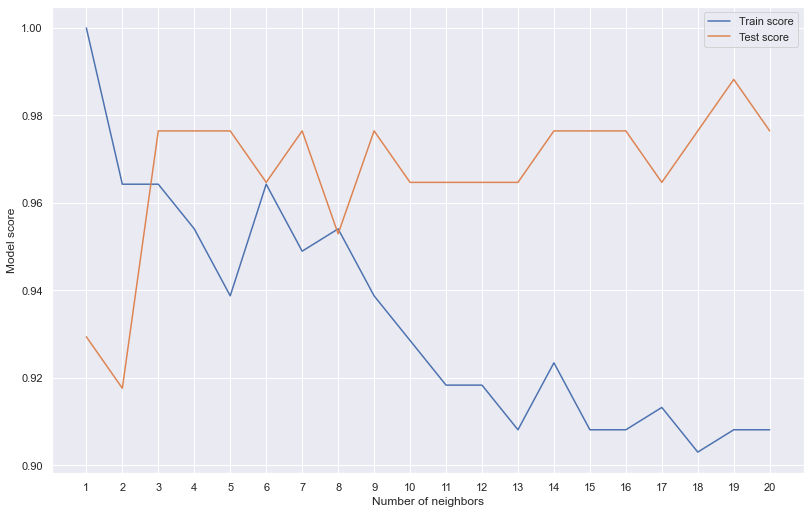

In [126]:
plt.figure(figsize=(12, 8))

plt.plot(neighbors, train_score, label="Train score")
plt.plot(neighbors, test_score, label="Test score")
plt.xticks(np.arange(1, 21, 1))
plt.xlabel("Number of neighbors")
plt.ylabel("Model score")
plt.legend()

print(f"Maximum KNN score on the test data: {max(test_score)*100:.2f}%")

In [127]:

knn_classifier = KNeighborsClassifier(n_neighbors=19)
knn_classifier.fit(X_train, y_train)

print_score(knn_classifier, X_train, y_train, X_test, y_test, train=True)
print_score(knn_classifier, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 90.82%
_______________________________________________
CLASSIFICATION REPORT:
                   0           1  accuracy   macro avg  weighted avg
precision   0.952941    0.873874  0.908163    0.913408      0.912197
recall      0.852632    0.960396  0.908163    0.906514      0.908163
f1-score    0.900000    0.915094  0.908163    0.907547      0.907778
support    95.000000  101.000000  0.908163  196.000000    196.000000
_______________________________________________
Confusion Matrix: 
 [[81 14]
 [ 4 97]]

Test Result:
Accuracy Score: 98.82%
_______________________________________________
CLASSIFICATION REPORT:
                   0          1  accuracy  macro avg  weighted avg
precision   1.000000   0.979167  0.988235   0.989583      0.988480
recall      0.973684   1.000000  0.988235   0.986842      0.988235
f1-score    0.986667   0.989474  0.988235   0.988070      0.988219
support    38.000000  47.000000  0.988235  85.000000     85.000000
_________________

In [128]:
test_score = accuracy_score(y_test, knn_classifier.predict(X_test)) * 100
train_score = accuracy_score(y_train, knn_classifier.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Tuned K-nearest neighbors", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
tuning_results_df = tuning_results_df.append(results_df_2, ignore_index=True)
tuning_results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Tuned Logistic Regression,100.000000,100.000000
1,Tuned K-nearest neighbors,90.816327,98.823529


## Support Vector Machine Hyperparameter Tuning

In [129]:

svm_model = SVC(kernel='rbf', gamma=0.1, C=1.0)

params = {"C":(0.1, 0.5, 1, 2, 5, 10, 20), 
          "gamma":(0.001, 0.01, 0.1, 0.25, 0.5, 0.75, 1), 
          "kernel":('linear', 'poly', 'rbf')}

svm_grid = GridSearchCV(svm_model, params, n_jobs=-1, cv=5, verbose=1, scoring="accuracy", iid=True)
# svm_grid.fit(X_train, y_train)

In [130]:
# svm_grid.best_estimator_
svm_model = SVC(C=5, cache_size=200, class_weight=None, coef0=0.0,
                 decision_function_shape='ovr', degree=3, gamma=0.01,
                 kernel='rbf', max_iter=-1, probability=False,
                 random_state=None, shrinking=True, tol=0.001,
                 verbose=False)
svm_model.fit(X_train, y_train)

print_score(svm_model, X_train, y_train, X_test, y_test, train=True)
print_score(svm_model, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0      1  accuracy  macro avg  weighted avg
precision   1.0    1.0       1.0        1.0           1.0
recall      1.0    1.0       1.0        1.0           1.0
f1-score    1.0    1.0       1.0        1.0           1.0
support    95.0  101.0       1.0      196.0         196.0
_______________________________________________
Confusion Matrix: 
 [[ 95   0]
 [  0 101]]

Test Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0     1  accuracy  macro avg  weighted avg
precision   1.0   1.0       1.0        1.0           1.0
recall      1.0   1.0       1.0        1.0           1.0
f1-score    1.0   1.0       1.0        1.0           1.0
support    38.0  47.0       1.0       85.0          85.0
_______________________________________________
Confusion Matrix: 
 [[38  0]
 [ 0 47]]



In [131]:
test_score = accuracy_score(y_test, svm_model.predict(X_test)) * 100
train_score = accuracy_score(y_train, svm_model.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Tuned Support Vector Machine", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
tuning_results_df = tuning_results_df.append(results_df_2, ignore_index=True)
tuning_results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Tuned Logistic Regression,100.000000,100.000000
1,Tuned K-nearest neighbors,90.816327,98.823529
2,Tuned Support Vector Machine,100.000000,100.000000


## Decision Tree Classifier Hyperparameter Tuning

In [132]:

params = {"criterion":("gini", "entropy"), 
          "splitter":("best", "random"), 
          "max_depth":(list(range(1, 20))), 
          "min_samples_split":[2, 3, 4], 
          "min_samples_leaf":list(range(1, 20))
          }

tree = DecisionTreeClassifier(random_state=42)
grid_search_cv = GridSearchCV(tree, params, scoring="accuracy", n_jobs=-1, verbose=1, cv=3, iid=True)
# grid_search_cv.fit(X_train, y_train)

In [133]:
# grid_search_cv.best_estimator_
tree = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=3,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=2,
                       min_weight_fraction_leaf=0.0,
                       random_state=42, splitter='random')
tree.fit(X_train, y_train)

print_score(tree, X_train, y_train, X_test, y_test, train=True)
print_score(tree, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0      1  accuracy  macro avg  weighted avg
precision   1.0    1.0       1.0        1.0           1.0
recall      1.0    1.0       1.0        1.0           1.0
f1-score    1.0    1.0       1.0        1.0           1.0
support    95.0  101.0       1.0      196.0         196.0
_______________________________________________
Confusion Matrix: 
 [[ 95   0]
 [  0 101]]

Test Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0     1  accuracy  macro avg  weighted avg
precision   1.0   1.0       1.0        1.0           1.0
recall      1.0   1.0       1.0        1.0           1.0
f1-score    1.0   1.0       1.0        1.0           1.0
support    38.0  47.0       1.0       85.0          85.0
_______________________________________________
Confusion Matrix: 
 [[38  0]
 [ 0 47]]



In [134]:
test_score = accuracy_score(y_test, tree.predict(X_test)) * 100
train_score = accuracy_score(y_train, tree.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Tuned Decision Tree Classifier", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
tuning_results_df = tuning_results_df.append(results_df_2, ignore_index=True)
tuning_results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Tuned Logistic Regression,100.000000,100.000000
1,Tuned K-nearest neighbors,90.816327,98.823529
2,Tuned Support Vector Machine,100.000000,100.000000
3,Tuned Decision Tree Classifier,100.000000,100.000000


## Random Forest Classifier Hyperparameter Tuning

In [135]:

from sklearn.model_selection import RandomizedSearchCV

n_estimators = [int(x) for x in np.linspace(start=200, stop=2000, num=10)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num=11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]

random_grid = {'n_estimators': n_estimators, 'max_features': max_features,
               'max_depth': max_depth, 'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf, 'bootstrap': bootstrap}

rand_forest = RandomForestClassifier(random_state=42)

rf_random = RandomizedSearchCV(estimator=rand_forest, param_distributions=random_grid, n_iter=100, cv=3, 
                               verbose=2, random_state=42, n_jobs=-1, iid=True)


# rf_random.fit(X_train, y_train)

In [136]:
# rf_random.best_estimator_
rand_forest = RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=70, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, n_estimators=400,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)
rand_forest.fit(X_train, y_train)

RandomForestClassifier(max_depth=70, min_samples_leaf=4, min_samples_split=10,
                       n_estimators=400, random_state=42)

In [137]:
print_score(rand_forest, X_train, y_train, X_test, y_test, train=True)
print_score(rand_forest, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0      1  accuracy  macro avg  weighted avg
precision   1.0    1.0       1.0        1.0           1.0
recall      1.0    1.0       1.0        1.0           1.0
f1-score    1.0    1.0       1.0        1.0           1.0
support    95.0  101.0       1.0      196.0         196.0
_______________________________________________
Confusion Matrix: 
 [[ 95   0]
 [  0 101]]

Test Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0     1  accuracy  macro avg  weighted avg
precision   1.0   1.0       1.0        1.0           1.0
recall      1.0   1.0       1.0        1.0           1.0
f1-score    1.0   1.0       1.0        1.0           1.0
support    38.0  47.0       1.0       85.0          85.0
_______________________________________________
Confusion Matrix: 
 [[38  0]
 [ 0 47]]



In [138]:
test_score = accuracy_score(y_test, rand_forest.predict(X_test)) * 100
train_score = accuracy_score(y_train, rand_forest.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Tuned Random Forest Classifier", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
tuning_results_df = tuning_results_df.append(results_df_2, ignore_index=True)
tuning_results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Tuned Logistic Regression,100.000000,100.000000
1,Tuned K-nearest neighbors,90.816327,98.823529
2,Tuned Support Vector Machine,100.000000,100.000000
3,Tuned Decision Tree Classifier,100.000000,100.000000
4,Tuned Random Forest Classifier,100.000000,100.000000


In [139]:
# Put the models in a Python dictionary
models = {
          'Logistic Regression': LogisticRegression(),
          'KNN': KNeighborsClassifier(),
          'Random Forest Classifier': RandomForestClassifier(),
          'Linear SVC': LinearSVC(),
          'SVC': SVC()
         }

# Create a function to fit and score the models
def fit_and_score(models, X_train, X_test, y_train, y_test):
    '''
    Fits and evaluates given machine learning models.
    models: a dict of different Sklearn models
    X_train: training data(no labels)
    X_test: testing data(no labels)
    y_train: training labels
    y_test: testing labels
    '''
    
     # Set up a random seed
    np.random.seed(42)

    # Create another dictionary to store model scores
    model_scores = {}
    # Loop through the models
    for name, model in models.items():
        # Fit the model to the data
        model.fit(X_train, y_train)
        # Evaluate the model and append to 'model_scores'
        model_scores[name] = model.score(X_test, y_test)
    return model_scores

{'Logistic Regression': 1.0,
 'KNN': 0.9764705882352941,
 'Random Forest Classifier': 1.0,
 'Linear SVC': 1.0,
 'SVC': 1.0}

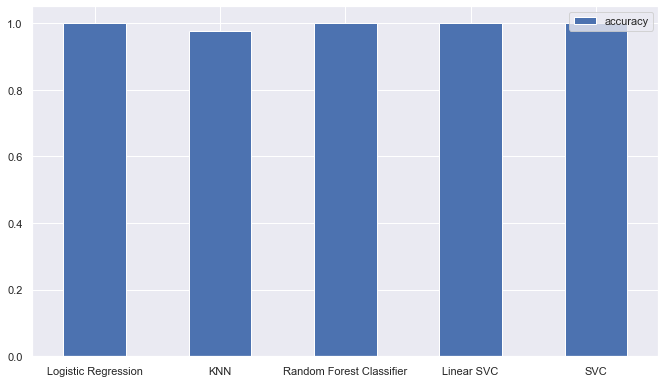

In [140]:
model_scores = fit_and_score(models, X_train, X_test, y_train, y_test)
model_compare = pd.DataFrame(model_scores, index=['accuracy'])
model_compare.T.plot.bar(figsize=(10, 6), rot=0);
model_scores

It looks like the Random Forest is overfitting so we will tune the Logistic Regression model
To tune the Logistic regression hyperparameters, we will use Grid Search CV

In [141]:
# Create a dictionary with hyperparams as keys and values as values
log_reg_grid = {
                'penalty': ['l1', 'l2'],
                'C': np.logspace(-8, 8, 100),
                'solver': ['liblinear']
               }

# Instantiate the GridSearchCV
gs_log_reg = GridSearchCV(LogisticRegression(random_state=42),
                          param_grid=log_reg_grid,
                          cv=10,
                          verbose=True,
                          n_jobs=-1)

gs_log_reg.fit(X_train, y_train)

Fitting 10 folds for each of 200 candidates, totalling 2000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 1440 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done 2000 out of 2000 | elapsed:   10.5s finished


GridSearchCV(cv=10, estimator=LogisticRegression(random_state=42), n_jobs=-1,
             param_grid={'C': array([1.00000000e-08, 1.45082878e-08, 2.10490414e-08, 3.05385551e-08,
       4.43062146e-08, 6.42807312e-08, 9.32603347e-08, 1.35304777e-07,
       1.96304065e-07, 2.84803587e-07, 4.13201240e-07, 5.99484250e-07,
       8.69749003e-07, 1.26185688e-06, 1.83073828e-06, 2.65608778e-06,
       3.85352859e-...
       8.49753436e+04, 1.23284674e+05, 1.78864953e+05, 2.59502421e+05,
       3.76493581e+05, 5.46227722e+05, 7.92482898e+05, 1.14975700e+06,
       1.66810054e+06, 2.42012826e+06, 3.51119173e+06, 5.09413801e+06,
       7.39072203e+06, 1.07226722e+07, 1.55567614e+07, 2.25701972e+07,
       3.27454916e+07, 4.75081016e+07, 6.89261210e+07, 1.00000000e+08]),
                         'penalty': ['l1', 'l2'], 'solver': ['liblinear']},
             verbose=True)

In [142]:
# Check the best combination of hyperparams
gs_log_reg.best_params_

{'C': 0.029150530628251816, 'penalty': 'l1', 'solver': 'liblinear'}

In [143]:
# Train a new Logistic Regression model with the best params for GridSearchCV
tuned_log_reg = LogisticRegression(C=1.2045035402587836, penalty='l2', solver='liblinear', random_state=42, n_jobs=-1)
tuned_log_reg.fit(X_train, y_train)
tuned_log_reg.score(X_test, y_test)

1.0

### Evaluating the tuned model
1. ROC curve and AUC score
2. Confusion matrix
3. Classification report
4. Evaluation metrics
    - Accuracy
    - Precision
    - Recall
    - F1 score

To draw comparisons and evaluate the model we first need to make predictions

In [144]:
import lightgbm as ltb
model = ltb.LGBMClassifier()
model.fit(X_train, y_train)



LGBMClassifier()

In [145]:
y_pred = model.predict(X_test)


In [146]:
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[38  0]
 [ 0 47]]


1.0

In [147]:
y_pred=tree.predict(X_test)

In [148]:
expected_y  = y_test
y_pred = model.predict(X_test)

In [149]:
from sklearn.model_selection import cross_val_score
accuracies = cross_val_score(estimator = model, X = X_train, y = y_train, cv = 30)
print("Accuracy: {:.2f} %".format(accuracies.mean()*100))
print("Standard Deviation: {:.2f} %".format(accuracies.std()*100))

Accuracy: 100.00 %
Standard Deviation: 0.00 %


In [150]:
# make predictions with the tuned model
y_preds = tuned_log_reg.predict(X_test)
y_preds

array([1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0,
       1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1,
       0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1,
       0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0],
      dtype=int64)

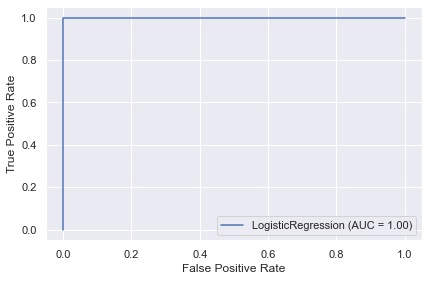

In [151]:
# Plot ROC curve and calculate the AUC metric
plot_roc_curve(tuned_log_reg, X_test, y_test);

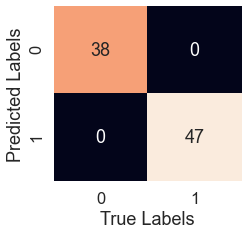

In [152]:
# Create a function to plot a confusion matrix
sns.set(font_scale=1.5)

def plot_conf_mat(y_test, y_preds):
    '''
    Plot a visual confusion matrix with Seaborn's `heatmap()` function.
    '''
    fig, ax = plt.subplots(figsize=(3, 3))
    ax = sns.heatmap(confusion_matrix(y_test, y_preds),
                     annot=True,
                     cbar=False)
    plt.xlabel("True Labels")
    plt.ylabel("Predicted Labels")
    
plot_conf_mat(y_test, y_preds)

In [153]:
print(classification_report(y_test, y_preds))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        38
           1       1.00      1.00      1.00        47

    accuracy                           1.00        85
   macro avg       1.00      1.00      1.00        85
weighted avg       1.00      1.00      1.00        85



In [154]:
# Cross validate the model with multiple metrics and find the mean of each metric's results

cv_metrics = cross_validate(tuned_log_reg,
                            X,
                            y,
                            cv=10,
                            scoring=['accuracy', 'precision', 'recall', 'f1'],)
    
# Calculate the mean for each metric
for k, v in cv_metrics.items():
    cv_metrics[k] = np.mean(v)
    
# return a dictionary of mean metric scores
cv_metrics

{'fit_time': 0.005204486846923828,
 'score_time': 0.005193042755126953,
 'test_accuracy': 1.0,
 'test_precision': 1.0,
 'test_recall': 1.0,
 'test_f1': 1.0}

In [155]:
# Delete the irrelevant information
del cv_metrics['fit_time']
del cv_metrics['score_time']

cv_metrics

{'test_accuracy': 1.0,
 'test_precision': 1.0,
 'test_recall': 1.0,
 'test_f1': 1.0}

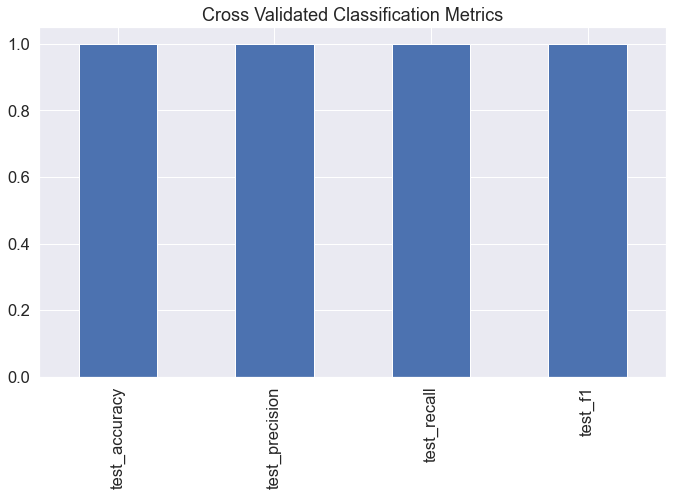

In [156]:
# Turn the dict into a DataFrame and then create a bar plot to visualize

cv_df = pd.DataFrame(cv_metrics, index=[0])
cv_df.T.plot.bar(figsize=(10, 6),
                 title="Cross Validated Classification Metrics",
                 legend=False);

In [157]:
cv_df

,test_accuracy,test_precision,test_recall,test_f1
0,1.0,1.0,1.0,1.0


### Feature Importance
Feature importance is another way of asking which features contributed most to the outcomes of the model and how they contributed Let's look at the feature impotance for the Logistic Regression model




In [158]:
# Match coefficient's of features to columns
feature_dict = dict(zip(df.columns, list(tuned_log_reg.coef_[0])))
feature_dict

{'age': -0.0913139151812664,
 'sex': -0.039720249691616506,
 'cp': -0.07763564256968115,
 'trestbps': 0.20267045045340926,
 'chol': -0.27719680414038206,
 'fbs': 0.1641904839516995,
 'restecg': -0.18243166531902016,
 'thalach': -0.45828005926022475,
 'exang': -0.03137734865171594,
 'oldpeak': 0.2761283836390126,
 'slope': 0.19528784290560583,
 'ca': -0.0256022737165893,
 'thal': 0.007361092349267592,
 'target': -0.0696450901324253,
 'target_group': 0.0846592765492854,
 'fbs_group': -0.03325536778418295,
 'age_group': 0.10275111973427062}

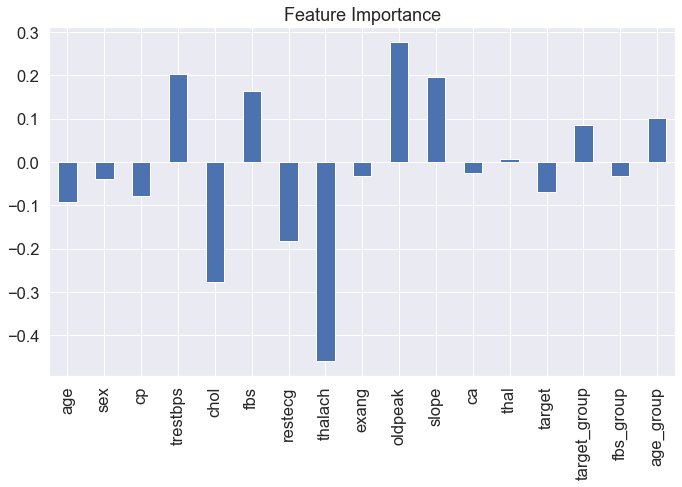

In [159]:
# Visualize the feature importance
feature_df = pd.DataFrame(feature_dict, index=[0])
feature_df.T.plot.bar(figsize=(10, 6),
                      title="Feature Importance",
                      legend=False);

In [160]:
from collections import Counter
import pandas_profiling as pp
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/31 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]